# Car Prices 4 Us

Setting prices for used cars in India is difficult due to the volatile market and large uncertainty in pricing. I'm hoping to greatly decrease the amount of uncertainty we have to deal with when pricing cars. I aim to answer the following questions.
 
1. What is the highest price we should purchase a car for?
2. What is the lowest price we should sell the car for?
3. What price should we put on the sticker?
4. How do we evaluate the effectiveness of sales personnel? 

To that end, I will:

Explore and visualize a dataset of used cars sold all across India, build a linear regression model to predict the prices of used cars, and use that model to help the business answer the above questions.


Data Dictionary:

1. S.No.: Serial number
2. Name: Name of the car which includes brand name and model name
3. Location: Location in which the car is being sold or is available for purchase (cities)
4. Year: Manufacturing year of the car
5. Kilometers_driven: The total kilometers driven in the car by the previous owner(s) in km
6. Fuel_Type: The type of fuel used by the car (Petrol, Diesel, Electric, CNG, LPG)
7. Transmission: The type of transmission used by the car (Automatic/Manual)
8. Owner: Type of ownership
9. Mileage: The standard mileage offered by the car company in kmpl or km/kg
10. Engine: The displacement volume of the engine in CC
11. Power: The maximum power of the engine in bhp
12. Seats: The number of seats in the car
13. New_Price: The price of a new car of the same model in INR Lakhs (1 Lakh INR = 100,000 INR)
14. Price: The price of the used car in INR Lakhs

In [1]:
import numpy as np   
from sklearn.linear_model import LinearRegression
import pandas as pd    
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from IPython.display import display
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")
import pandas_profiling
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Preprocessing

In [2]:
#Load the relevant data. We're looking at used cars today.
data = pd.read_csv("used_cars_data.csv")

In [3]:
#Making a copy of the data so we can always go look at the original if we want.
carz = data.copy()

In [4]:
#check for duplication
carz.duplicated().sum()

0

There seem to be no duplicate rows in the data. That's good.

In [5]:
print(f'There are {carz.shape[0]} rows and {carz.shape[1]} columns.')

#Setting the random seed so I get the same rows each time I reload the notebook
np.random.seed(1)
#This randomly samples rows from the dataset as according to the seed above.
carz.sample(n=10)

There are 7253 rows and 14 columns.


,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
2397,2397,Ford EcoSport 1.5 Petrol Trend,Kolkata,2016,21460,Petrol,Manual,First,17.0 kmpl,1497 CC,121.36 bhp,5.0,9.47 Lakh,6.00
3777,3777,Maruti Wagon R VXI 1.2,Kochi,2015,49818,Petrol,Manual,First,21.5 kmpl,1197 CC,81.80 bhp,5.0,5.44 Lakh,4.11
4425,4425,Ford Endeavour 4x2 XLT,Hyderabad,2007,130000,Diesel,Manual,First,13.1 kmpl,2499 CC,141 bhp,7.0,NaN,6.00
3661,3661,Mercedes-Benz E-Class E250 CDI Avantgrade,Coimbatore,2016,39753,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.0,NaN,35.28
4514,4514,Hyundai Xcent 1.2 Kappa AT SX Option,Kochi,2016,45560,Petrol,Automatic,First,16.9 kmpl,1197 CC,82 bhp,5.0,NaN,6.34
599,599,Toyota Innova Crysta 2.8 ZX AT,Coimbatore,2019,40674,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,7.0,28.05 Lakh,24.82
186,186,Mercedes-Benz E-Class E250 CDI Avantgrade,Bangalore,2014,37382,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.0,NaN,32.00
305,305,Audi A6 2011-2015 2.0 TDI Premium Plus,Kochi,2014,61726,Diesel,Automatic,First,17.68 kmpl,1968 CC,174.33 bhp,5.0,NaN,20.77
4582,4582,Hyundai i20 1.2 Magna,Kolkata,2011,36000,Petrol,Manual,First,18.5 kmpl,1197 CC,80 bhp,5.0,NaN,2.50
5434,5434,Honda WR-V Edge Edition i-VTEC S,Kochi,2019,13913,Petrol,Manual,First,17.5 kmpl,1199 CC,88.7 bhp,5.0,9.36 Lakh,8.20


At first glance, it seems like all of these columns except S.No can potentially be used in the further analysis. The  exception may be "name" as we may have to transform that data into other more useful bits of information first. For example, it may be important that the car is a Hyundai, it may be less important that it is a Magna. Otherwise, S.No may also be dropped as we don't really need a second unique modifier for each row.

We'll also need to convert several of the columns to numbers. Mileage, Engine, Power, and New Price are all strings that should be made into integers or floats.

In [6]:
#Let's go ahead and drop S.No.
carz.drop(['S.No.'],axis=1,inplace=True)

In [7]:
#Getting basic descriptive statistics for each numerical column.
carz.describe().round(2)

,Year,Kilometers_Driven,Seats,Price
count,7253.00,7253.00,7200.00,6019.00
mean,2013.37,58699.06,5.28,9.48
std,3.25,84427.72,0.81,11.19
min,1996.00,171.00,0.00,0.44
25%,2011.00,34000.00,5.00,3.50
50%,2014.00,53416.00,5.00,5.64
75%,2016.00,73000.00,5.00,9.95
max,2019.00,6500000.00,10.00,160.00


There is a car with 0 seats? That's clearly an error. We'll have to check that out later.
Also, yowsers, there's a lot of skew and some huge outliers. We'll take care of those later as well.

In [8]:
#Checking how many columns we have remaining as well as missing values
carz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               7253 non-null   object 
 1   Location           7253 non-null   object 
 2   Year               7253 non-null   int64  
 3   Kilometers_Driven  7253 non-null   int64  
 4   Fuel_Type          7253 non-null   object 
 5   Transmission       7253 non-null   object 
 6   Owner_Type         7253 non-null   object 
 7   Mileage            7251 non-null   object 
 8   Engine             7207 non-null   object 
 9   Power              7207 non-null   object 
 10  Seats              7200 non-null   float64
 11  New_Price          1006 non-null   object 
 12  Price              6019 non-null   float64
dtypes: float64(2), int64(2), object(9)
memory usage: 736.8+ KB


As was already observed, many of these columns that should be float or integers are not. Mileage, Engine, Power, and New Price should not be object type.

The categorical variables should also be turned into one-hot prior to deeper analysis so they can be used in a regression.

Mileage, Engine, Power, and Seats have some missing values but not a lot. Price has a substantial number of missing values, and New_Price is almost entirely missing values.

## Converting object columns to floats

The first thing we want to do is fix the columns that should be floats but are not. Mileage, Engine, Power, and New_Price all have their units in the cell, causing the entire cell to be a string rather than a number. I'll have to remove them, and just put the unit in the column name for easy reference.

In [9]:
#I am going to make loops that cover the entire dataframe to make sure I'm not missing anything.
# The dataframe is relatively small but I want to do this anyway to promote good habits.

#This loop is to check for kmpl.
kmpl_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('kmpl').any(): #check for more columns ending with the kmpl unit.
        kmpl_cols.append(colname)
print(f'The following columns end in the unit name kmpl:{kmpl_cols}')

The following columns end in the unit name kmpl:['Mileage']


In [10]:
# Now I want to check if there are any other units used in Mileage.
carz[carz['Mileage'].str.endswith('kmpl')==False]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,LPG,Manual,First,21.1 km/kg,814 CC,55.2 bhp,5.0,NaN,2.35
127,Maruti Wagon R LXI CNG,Pune,2013,89900,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,3.25
328,Maruti Zen Estilo LXI Green (CNG),Pune,2008,42496,CNG,Manual,First,26.3 km/kg,998 CC,67.1 bhp,5.0,NaN,1.40
440,Maruti Eeco 5 STR With AC Plus HTR CNG,Kochi,2017,31841,CNG,Manual,First,15.1 km/kg,1196 CC,73 bhp,5.0,NaN,4.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6538,Maruti Alto K10 LXI CNG,Kochi,2015,47490,CNG,Manual,First,32.26 km/kg,998 CC,58.2 bhp,4.0,NaN,NaN
6788,Maruti Alto K10 LXI CNG Optional,Delhi,2017,33000,CNG,Manual,First,32.26 km/kg,998 CC,58.2 bhp,4.0,4.66 Lakh,NaN
6918,Hyundai Accent Executive LPG,Jaipur,2010,40000,LPG,Manual,Second,13.2 km/kg,1495 CC,93.7 bhp,5.0,NaN,NaN
6926,Maruti Eeco 5 STR With AC Plus HTR CNG,Mumbai,2017,15500,CNG,Manual,First,15.1 km/kg,1196 CC,73 bhp,5.0,NaN,NaN


In [11]:
#Just checking if there are any cells that end with something else.
carz[(carz['Mileage'].str.endswith('kmpl')==False)&(carz['Mileage'].str.endswith('km/kg')==False)]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price


It seems km/kg is also used in Mileage, but no other units besides that and kmpl. I'll search the database for this too.

In [12]:
#This loop is to check for km/kg.
kmkg_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('km/kg').any(): #check for more columns ending with the km/kg unit.
        kmkg_cols.append(colname)
print(f'The following columns have entries that end in the unit name km/kg:{kmkg_cols}')

The following columns have entries that end in the unit name km/kg:['Mileage']


The mileage entries are not comparable directly because they use different fuel types and measurements. One liter of deisel is not equal to one liter of petrol, and 1kg of a gas is certainly not equal to 1 liter of a liquid.

However, I was instructed to ignore this fact for this analysis, so I will simply remove the unit.

In [13]:
#This loop is to check for CC.
CC_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('CC').any(): #check for more columns ending with the CC unit.
        CC_cols.append(colname)
print(f'The following columns end in the unit name CC:{CC_cols}')

The following columns end in the unit name CC:['Engine']


Let's go ahead and check if this column ends with anything else.

In [14]:
carz[carz['Engine'].str.endswith('CC')==False]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price


Ok good, every cell in Engine ends with CC. I won't need to do any conversions.

In [15]:
#This loop is to check for bhp.
bhp_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('bhp').any(): #check for more columns ending with the bhp unit.
        bhp_cols.append(colname)
print(f'The following columns end in the unit name bhp:{bhp_cols}')

The following columns end in the unit name bhp:['Power']


In [16]:
carz[carz['Power'].str.endswith('bhp')==False]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price


Every cell in Power ends with the unit bhp. No conversions will be necessary.

In [17]:
#This loop is to check for Lakh.
Lakh_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('Lakh').any(): #check for more columns ending with the bhp unit.
        Lakh_cols.append(colname)
print(f'The following columns end in the unit name Lakh:{Lakh_cols}')

The following columns end in the unit name Lakh:['New_Price']


In [18]:
#Checking to see if New_Price has any other endings.
carz[carz['New_Price'].str.endswith('Lakh')==False]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
148,Audi RS5 Coupe,Mumbai,2013,23000,Petrol,Automatic,First,11.05 kmpl,2894 CC,444 bhp,4.0,1.28 Cr,37.00
327,Audi Q7 45 TDI Quattro Technology,Coimbatore,2017,97430,Diesel,Automatic,First,14.75 kmpl,2967 CC,245 bhp,7.0,1.04 Cr,62.67
489,Mercedes-Benz GLS 350d 4MATIC,Pune,2017,129000,Diesel,Automatic,First,11.0 kmpl,2987 CC,258 bhp,7.0,1 Cr,56.00
1336,Audi Q7 45 TDI Quattro Technology,Mumbai,2016,20002,Diesel,Automatic,First,14.75 kmpl,2967 CC,245 bhp,7.0,1.04 Cr,67.00
1505,Land Rover Range Rover Sport SE,Kochi,2019,26013,Diesel,Automatic,First,12.65 kmpl,2993 CC,255 bhp,5.0,1.39 Cr,97.07
1885,Mercedes-Benz GLS 350d Grand Edition,Delhi,2018,6000,Diesel,Automatic,First,11.0 kmpl,2987 CC,258 bhp,7.0,1.02 Cr,79.00
2056,BMW 7 Series 730Ld Eminence,Kochi,2015,29966,Diesel,Automatic,Second,16.77 kmpl,2993 CC,261.49 bhp,5.0,1.4 Cr,43.60
2095,Mercedes-Benz SLC 43 AMG,Coimbatore,2019,2526,Petrol,Automatic,First,19.0 kmpl,2996 CC,362.07 bhp,2.0,1.06 Cr,83.96
2178,Land Rover Discovery HSE Luxury 3.0 TD6,Mumbai,2017,35000,Diesel,Automatic,First,18.0 kmpl,2993 CC,255 bhp,7.0,1.27 Cr,41.60
2528,Land Rover Discovery SE 3.0 TD6,Delhi,2016,59000,Diesel,Automatic,First,18.0 kmpl,2993 CC,255 bhp,7.0,1.13 Cr,36.75


New_Price also ends with Cr, so I'll check the dataframe for that too.

In [19]:
#This loop is to check for Cr.
Cr_cols = []
for colname in carz.columns[carz.dtypes == 'object']:
    if carz[colname].str.endswith('Lakh').any(): #check for more columns ending with the bhp unit.
        Cr_cols.append(colname)
print(f'The following columns end in the unit name Cr:{Cr_cols}')

The following columns end in the unit name Cr:['New_Price']


In [20]:
#Going to double check there are no other units in the New_Price column besides Cr and Lakh.
carz[(carz['New_Price'].str.endswith('Cr')==False)&(carz['New_Price'].str.endswith('Lakh')==False)]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price


Good, there are no rows in New_Price that end in something besides Lakh and Cr. That should be everything, time to remove these units and convert to floats.

In [21]:
"""Now I am going to make functions to go through the columns I found that should be float data
but instead are objects and remove all of the text that is unnecessarily in the cell with the numbers.
 While I do this, I am going to simultaneously convert units to be identical."""

def gas_convertion(column):
    """I am making this function to go through and remove the unit name kmpl I located
    by manually scanning the dataframe, which I then verified automatically above. I also
    noticed that in that same column some of the mileages were km/kg, so I will be converting
    those to kmpl by removing their unit, as instructed. Then, once the unit name is removed, I will 
    convert the column elements into floats."""
    if isinstance(column,str):
        if column.endswith('km/kg'):
            return (float(column.replace('km/kg','')))
        if column.endswith('kmpl'):
            return float(column.replace('kmpl',''))
    else:
        return np.nan

In [22]:
#Applying the function to remove the units
for columns in kmpl_cols:
    carz[columns] = carz[columns].apply(gas_convertion)

In [23]:
#Now I will do the same to remove CC from its column and convert the column to float.
def CC_removal(column):
    if isinstance(column,str):
        if column.endswith('CC'):
            return float(column.replace('CC',''))
    else:
        return np.nan

for columns in CC_cols:
    carz[columns] = carz[columns].apply(CC_removal)


In [24]:
#Now I will do the same to remove Lakh and Cr from its column and convert the column to float.
#I will also convert Cr to Lakh.
def Lakh_remove_convert(column):
    if isinstance(column,str):
        if column.endswith('Cr'):
            return (float(column.replace('Cr',''))*100) #Unit conversion, 1 Cr = 100 Lakh
        if column.endswith('Lakh'):
            return float(column.replace('Lakh',''))
    else:
        return np.nan
for columns in Lakh_cols:
    carz[columns] = carz[columns].apply(Lakh_remove_convert)

In [25]:
#I have to use a different kind of code to remove bhp because I keep getting a KeyError using the
# other format. I think this is because some missing values are NaN while others are Null or nan.

carz['Power']=carz['Power'].str.rstrip('bhp') #Remove the bhp

for i,row in carz.iterrows():
    power_data=str(carz.at[i,'Power'])
    #---Null values
    if (power_data)=="nan":  
        carz.at[i,'Power']=np.nan 
    #----null
    elif power_data.strip()=='null': 
        carz.at[i,'Power']=np.nan
    #---Non Nulls    
    else:
        power_data=power_data.strip()
        carz.at[i,'Power']=power_data
        
carz["Power"]=carz["Power"].astype(float) #Type conversion or changing column type

In [26]:
carz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               7253 non-null   object 
 1   Location           7253 non-null   object 
 2   Year               7253 non-null   int64  
 3   Kilometers_Driven  7253 non-null   int64  
 4   Fuel_Type          7253 non-null   object 
 5   Transmission       7253 non-null   object 
 6   Owner_Type         7253 non-null   object 
 7   Mileage            7251 non-null   float64
 8   Engine             7207 non-null   float64
 9   Power              7078 non-null   float64
 10  Seats              7200 non-null   float64
 11  New_Price          1006 non-null   float64
 12  Price              6019 non-null   float64
dtypes: float64(6), int64(2), object(5)
memory usage: 736.8+ KB


As we can see, now all of the previous object columns that should have been floats are now floats.

## Missing Values

Now that we've changed data types it's time to do something with our missing values.

In [27]:
#Getting actual number of missing values per column
carz.isnull().sum().sort_values(ascending=False)

New_Price            6247
Price                1234
Power                 175
Seats                  53
Engine                 46
Mileage                 2
Name                    0
Location                0
Year                    0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
dtype: int64

New_Price has an enormous number of missing values. Although in theory the price of a new version of that model would affect the price of a used version of that car, we're just not going to see much utility from it with this many missing values. I'm just going to drop it.

In [28]:
#Dropping New_Price
carz.drop(['New_Price'],axis=1,inplace=True)

Next, Price itself has a lot of missing values. This is our dependent variable, so filling in these mising values is problematic. Because we have a large sample even with these rows missing, I think it best to just drop all of these entries.

In [29]:
#We are predicting Price, so filling it in is not acceptable. Got to drop those.
carz.dropna(subset=["Price"], inplace=True)

In [30]:
#Counting the number of missing values per row.
num_missing = carz.isnull().sum(axis=1)
num_missing.value_counts()

0    5872
1     107
3      36
2       4
dtype: int64

In [31]:
#Let's look again to see where the missing values are.
carz.isnull().sum().sort_values(ascending=False)

Power                143
Seats                 42
Engine                36
Mileage                2
Name                   0
Location               0
Year                   0
Kilometers_Driven      0
Fuel_Type              0
Transmission           0
Owner_Type             0
Price                  0
dtype: int64

In [32]:
#Let's start with some low hanging fruit.
carz[carz['Mileage'].isnull()==True]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
4446,Mahindra E Verito D4,Chennai,2016,50000,Electric,Automatic,First,NaN,72.0,41.0,5.0,13.00
4904,Toyota Prius 2009-2016 Z4,Mumbai,2011,44000,Electric,Automatic,First,NaN,1798.0,73.0,5.0,12.75


<!-- Both of the electric cars don't have a mileage. However, I can look up their average cost per km in electricity. -->

Electric cars don't have fuel mileage. Even if I looked it up, it'd be not comparable to the other units. I'm just going to drop them. There's probably only the two anyway.

In [33]:
#Checking to see if there are more than two electric cars.
carz['Fuel_Type'].value_counts()['Electric']

2

In [34]:
#Dropping the two electric cars. There's only two.
carz.drop(carz[carz['Fuel_Type']=='Electric'].index,inplace=True)

We should be able to fill in the missing values for Power. Let's take a look at it to see if there is a pattern in which values are missing.

In [35]:
carz[carz['Power'].isnull()==True].sample(10)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
4351,Maruti Esteem LX BSII,Jaipur,2003,55000,Petrol,Manual,Third,15.9,1298.0,NaN,5.0,0.70
3404,Maruti Swift 1.3 VXi,Jaipur,2006,125000,Petrol,Manual,Fourth & Above,16.1,NaN,NaN,NaN,2.35
2130,Hyundai Santro GLS I - Euro II,Coimbatore,2012,51019,Petrol,Manual,First,0.0,999.0,NaN,5.0,3.48
4744,Hyundai Santro Xing XL eRLX Euro III,Kolkata,2005,45000,Petrol,Manual,First,17.0,1086.0,NaN,5.0,0.95
307,Hyundai Santro Xing XL,Chennai,2006,58000,Petrol,Manual,Second,0.0,1086.0,NaN,5.0,1.50
915,Smart Fortwo CDI AT,Pune,2008,103000,Diesel,Automatic,Second,0.0,799.0,NaN,2.0,3.00
3733,Maruti Esteem Vxi,Delhi,2005,69496,Petrol,Manual,First,15.9,1298.0,NaN,5.0,1.10
2369,Maruti Estilo LXI,Chennai,2008,56000,Petrol,Manual,Second,19.5,1061.0,NaN,NaN,1.50
3290,Ford Fiesta 1.4 SXi TDCi,Hyderabad,2008,83000,Diesel,Manual,Second,17.8,1399.0,NaN,5.0,2.40
5925,Skoda Laura Classic 1.8 TSI,Pune,2010,85000,Petrol,Manual,First,17.5,1798.0,NaN,5.0,2.85


There is no pattern as far as I can tell. Let's see if I can just use another variable to predict those empty values.

In [36]:
#Checking correlations between variables
carz.corr().round(2)

,Year,Kilometers_Driven,Mileage,Engine,Power,Seats,Price
Year,1.00,-0.17,0.32,-0.05,0.01,0.01,0.31
Kilometers_Driven,-0.17,1.00,-0.07,0.09,0.03,0.08,-0.01
Mileage,0.32,-0.07,1.00,-0.60,-0.54,-0.31,-0.31
Engine,-0.05,0.09,-0.60,1.00,0.87,0.39,0.66
Power,0.01,0.03,-0.54,0.87,1.00,0.10,0.77
Seats,0.01,0.08,-0.31,0.39,0.10,1.00,0.05
Price,0.31,-0.01,-0.31,0.66,0.77,0.05,1.00


Engine correlates with Power at .87, that is extremely high. They are effectively identical. I should be able to use Engine to compute Power values without a high degree of error.

Because the Engine value is present for most of the cars missing a Power entry. I'm going to fill in the values by predicting them with Engine. I'm going to do a simple regression to predict those values.

There are some instances where both Engine and Power are missing. I'll have to exclude those for the regression to work.

In [37]:
# Make a dataframe of just instances where Power/Engine are not missing. 
# Regressions need columns of identical length with no missing values.
df_powreg = carz[(carz['Power'].notnull()) & (carz['Engine'].notnull())]
#Split the df into its two component parts. We'll be predicting Power (x) with Engine (y)
x_powreg = df_powreg[["Engine"]]
y_powreg = df_powreg[['Power']]

#split the data into train/test. 30% of our data will be testing data.
x_train,x_test,y_train,y_test=train_test_split(x_powreg,y_powreg,test_size=0.3,random_state=1)

#Make and train the regression model with the above values.
lin_reg_model = LinearRegression()
lin_reg_model.fit(x_train, y_train)

LinearRegression()

In [38]:
#Make a function for displaying how well our models are working.
def model_perf(model, inp, out):

    y_pred = model.predict(inp)
    y_act = out.values

    return pd.DataFrame(
        {
            "RMSE": np.sqrt(mean_squared_error(y_act, y_pred)), #Root Mean Square Error
            "MAE": mean_absolute_error(y_act, y_pred), #Mean Absolute Error
            "R^2": r2_score(y_act, y_pred), #R2
            "Adjusted R^2": adj_r2(inp, y_act, y_pred), #Adjusted R2
        },
        index=[0],
    )

In [39]:
#Make a function for calculating adjusted R2.
def adj_r2(ind_vars, targets, predictions):
    
    r2 = r2_score(targets, predictions)
    n = ind_vars.shape[0]
    k = ind_vars.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

In [40]:
print("Training Performance\n")
display(model_perf(lin_reg_model, x_train, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model, x_test, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,27.238278,17.437242,0.74367,0.743608




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,26.131963,16.463657,0.76605,0.765917


That is a very strong regression score that works well in both training and testing data. While not perfect, I think replacing the missing Power scores with the scores predicted by the Engine value will be much better than just replacing everything with a mean or median of Power.

I could make a multi-variate model to try and predict it, but with a R2 that high and other correlations so low I really don't think we'd see much gain, if any, from doing so and that's just a lot of work for such a small percent of the data.

In [41]:
#Looping through each instance where there is an Engine value but not a Power value
for i,x in carz.iterrows():
    
    if pd.isna(carz.at[i,'Power']):
        
        if pd.isna(carz.at[i,'Engine'])==False:
            #Transforming it into an array so that the codes work. It errors otherwise.
            arr=np.array(carz.at[i,'Engine'])
            #Reshaping the array. The regression model can't handle 1D arrays.
            arr=arr.reshape(1, -1)
            #getting the predicted value, given Engine
            pred=lin_reg_model.predict(arr)[0][0]
            #replacing the missing Power value with the predicted value
            carz.at[i,'Power'] = pred

In [42]:
#Now let's see how many missing values we got rid of doing this
carz.isnull().sum().sort_values(ascending=False)

Seats                42
Engine               36
Power                36
Name                  0
Location              0
Year                  0
Kilometers_Driven     0
Fuel_Type             0
Transmission          0
Owner_Type            0
Mileage               0
Price                 0
dtype: int64

Nice, but there are still 36 Power values remaining. No other variables exist that can predict Power well besides Price and I am unwilling to use our dependent variable to affect the independent variables. For these missing values of Power I'm just going to MICE. I'll do the same for Engine and Seats, though I'll round Seats to the nearest whole number. It'd be weird to have .3 seats.

In [43]:
#The imputer runs MICE on all missing values in the columns I feed it.
imputer = IterativeImputer(random_state=0)
cols_to_be_imputed = ['Power','Engine','Seats']
carz[cols_to_be_imputed]=imputer.fit_transform(carz[cols_to_be_imputed])

In [44]:
#Rounding Seats to whole numbers
carz['Seats'] = round(carz['Seats'])

In [45]:
#Checking to see if we got all the nulls.
carz.isnull().sum().sort_values(ascending=False)

Name                 0
Location             0
Year                 0
Kilometers_Driven    0
Fuel_Type            0
Transmission         0
Owner_Type           0
Mileage              0
Engine               0
Power                0
Seats                0
Price                0
dtype: int64

Missing values all dealt with. Time to move on.

## Outliers

I will need to check for and deal with outliers. Let's identify which columns need a closer look.

In [46]:
#All numerical columns. Only numerical columns can have outliers.
num_cols = carz.select_dtypes(include=np.number).columns.tolist()
num_cols

['Year', 'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats', 'Price']

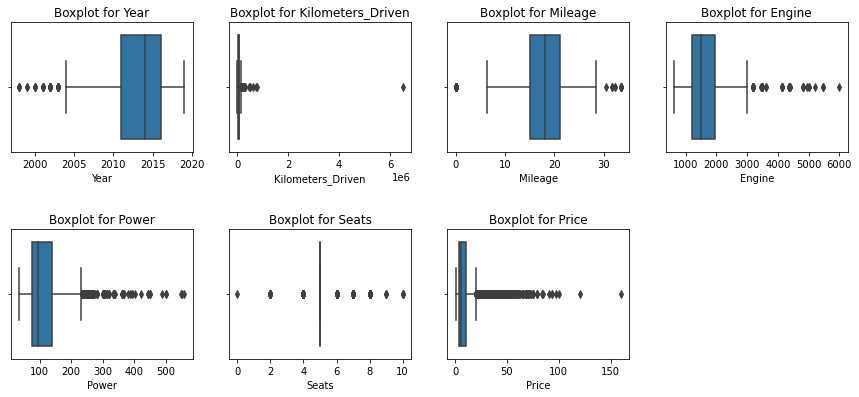

In [47]:
#Making boxplots for each to see which have lots of outliers that may be the product of errors.

plt.figure(figsize=(15,10))
pos = 1
for i in num_cols:
    plt.subplot(3, 4, pos)
    sns.boxplot(carz[i])
    plt.title(f'Boxplot for {i}')
    plt.subplots_adjust(hspace = 0.6)
    pos += 1

Outliers are highly context dependent. Looking over these, I see a few that I need to look closer at. Namely, kilometers driven has one outlier that is quite extreme. Price does as well. Mileage probably shouldn't have a 0 or near 0, and lastly Engine may have a few incorrect values.

### Kilometers_driven outliers

In [48]:
#Pulling the quartiles
quartiles = np.quantile(carz['Kilometers_Driven'][carz['Kilometers_Driven'].notnull()],[.25,.75])
#Multiplying quartiles by 4 for an extended 'whisker'
power_4iqr = 4 * (quartiles[1] - quartiles[0])
#printing our quartiles for reference
print(f'The quartiles for Kilometers_Driven are the following: Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 4*IQR = {power_4iqr}')
#Identifying which values are outside even 4*IQR
outlier_kmd = carz.loc[np.abs(carz['Kilometers_Driven'] - carz['Kilometers_Driven'].median()) >
                       power_4iqr, 'Kilometers_Driven']
outlier_kmd.sort_values(ascending = False)

The quartiles for Kilometers_Driven are the following: Q1 = 34000.0, Q3 = 73000.0, 4*IQR = 156000.0


2328    6500000
340      775000
1860     720000
358      620000
3092     480000
2823     480000
4491     445000
3649     300000
1528     299322
1975     282000
29       262000
1846     255000
4719     250000
3894     250000
5834     250000
1101     248000
4792     242000
2988     240000
2346     234000
3713     232000
1442     231673
77       230000
5647     227000
1068     225000
1766     220000
181      216000
2267     215750
838      215000
5800     210000
Name: Kilometers_Driven, dtype: int64

That's quite a lot of outliers outside 4* the IQR. Having purchased a car with over 200,000 miles on it myself, I know that is definitely within the realm of possibility for cars to have over 300,000km. However, those top four values are suspicious. I want a closer look to see if they are anomalous.

In [49]:
#Let's look at the 65 million km car
carz.iloc[2328]

Name                 BMW X5 xDrive 30d M Sport
Location                               Chennai
Year                                      2017
Kilometers_Driven                      6500000
Fuel_Type                               Diesel
Transmission                         Automatic
Owner_Type                               First
Mileage                                  15.97
Engine                                  2993.0
Power                                    258.0
Seats                                      5.0
Price                                     65.0
Name: 2328, dtype: object

65,000,000 km on a 2017 car with only one owner? Yeah, no. That's an error. I'm going to replace it with a more reasonable number. Besides this outlier, I want to see what correlates strongest with Mileage to see what factors I should look at. I could run another regression but that's a lot of effort for one value.

In [50]:
#Pulling up correlations to find a match.
carz.corr().round(1)

,Year,Kilometers_Driven,Mileage,Engine,Power,Seats,Price
Year,1.0,-0.2,0.3,-0.1,0.0,0.0,0.3
Kilometers_Driven,-0.2,1.0,-0.1,0.1,0.0,0.1,-0.0
Mileage,0.3,-0.1,1.0,-0.6,-0.5,-0.3,-0.3
Engine,-0.1,0.1,-0.6,1.0,0.9,0.4,0.7
Power,0.0,0.0,-0.5,0.9,1.0,0.1,0.8
Seats,0.0,0.1,-0.3,0.4,0.1,1.0,0.1
Price,0.3,-0.0,-0.3,0.7,0.8,0.1,1.0


Nothing correlates with it. I guess I'll just have to match categorical variables.

In [51]:
carz[(carz['Year']==2017) & (carz['Name'].str.startswith('BMW')) & (carz['Fuel_Type'] == 'Diesel') 
     & (carz['Engine']  == 2993)& (carz['Owner_Type'] == 'First')]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
271,BMW X3 xDrive30d M Sport,Coimbatore,2017,51982,Diesel,Automatic,First,16.55,2993.0,258.0,5.0,45.77
1924,BMW 5 Series 2013-2017 530d M Sport,Coimbatore,2017,27313,Diesel,Automatic,First,14.69,2993.0,258.0,5.0,48.63
2328,BMW X5 xDrive 30d M Sport,Chennai,2017,6500000,Diesel,Automatic,First,15.97,2993.0,258.0,5.0,65.00
4614,BMW X5 X5 M,Chennai,2017,15000,Diesel,Automatic,First,15.97,2993.0,258.0,5.0,70.00


Those cars are very similar. Given the similarities, I am going to average their km driven rather than average the whole column.

In [52]:
#First drop the value we want to replace to another variable
kmfix = carz.drop(carz.index[[2328]])
#Get the average km driven for the other similar cars
km_outlier_fix = kmfix[(kmfix['Year']==2017) 
                      & (kmfix['Name'].str.startswith('BMW')) 
                      & (kmfix['Fuel_Type'] == 'Diesel')
                      & (kmfix['Owner_Type'] == 'First')
                      & (kmfix['Engine'] == 2993)]['Kilometers_Driven'].mean()
#Set the value to that average.
carz.at[2328,'Kilometers_Driven'] = km_outlier_fix
#Print the numbers.
print('The outlying value of 65,000,000 has been replaced with {}'.format(carz.loc[2328]['Kilometers_Driven']))

The outlying value of 65,000,000 has been replaced with 31431


Next, I want to make sure the 70k+ km driven are not errors. Let's pull them up.

In [53]:
carz[carz['Kilometers_Driven'] > 500000]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
340,Skoda Octavia Ambition Plus 2.0 TDI AT,Kolkata,2013,775000,Diesel,Automatic,First,19.30,1968.0,141.0,5.0,7.5
358,Hyundai i10 Magna 1.2,Chennai,2009,620000,Petrol,Manual,First,20.36,1197.0,78.9,5.0,2.7
1860,Volkswagen Vento Diesel Highline,Chennai,2013,720000,Diesel,Manual,First,20.54,1598.0,103.6,5.0,5.9


I can't see anything glaringly bad with these three. Their KM driven are very unlikely but not impossible. I don't feel comfortable just deleting them. I'll leave them in.

### Mileage Outliers

First thing first, mileage should have no zeroes.

In [54]:
#Getting which cars have 0 mileage
carz[carz['Mileage']==0]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
14,Land Rover Freelander 2 TD4 SE,Pune,2012,85000,Diesel,Automatic,Second,0.0,2179.000000,115.000000,5.0,17.50
67,Mercedes-Benz C-Class Progressive C 220d,Coimbatore,2019,15369,Diesel,Automatic,First,0.0,1950.000000,194.000000,5.0,35.67
79,Hyundai Santro Xing XL,Hyderabad,2005,87591,Petrol,Manual,First,0.0,1086.000000,71.332654,5.0,1.30
194,Honda City 1.5 GXI,Ahmedabad,2007,60006,Petrol,Manual,First,0.0,1621.505935,112.943327,5.0,2.95
229,Ford Figo Diesel,Bangalore,2015,70436,Diesel,Manual,First,0.0,1498.000000,99.000000,5.0,3.60
...,...,...,...,...,...,...,...,...,...,...,...,...
5647,Toyota Qualis Fleet A3,Mumbai,2001,227000,Diesel,Manual,Fourth & Above,0.0,2446.000000,176.303114,8.0,2.20
5875,Mercedes-Benz C-Class Progressive C 220d,Ahmedabad,2019,4000,Diesel,Automatic,First,0.0,1950.000000,194.000000,5.0,35.00
5943,Mahindra Jeep MM 540 DP,Chennai,2002,75000,Diesel,Manual,First,0.0,2112.000000,150.523604,6.0,1.70
5972,Hyundai Santro Xing GL,Mumbai,2008,65000,Petrol,Manual,Second,0.0,1086.000000,62.000000,5.0,1.39


68 zeroes is ridiculous. Unfortunately, there doesn't seem to be any patterns. Additionally, no single variable stands out as being highly correlated to Mileage. That means a simple regression wouldn't end up being very accurate. Even so, I want to avoid mean/median substitution, so I'm going to run and test a multivariate regression to see if I can get a decent R2 to predict what those 0s should actually be.

In [55]:
#Create a new df with just columns we can use in a regression model. May as well check how many work.
df_mileage = carz.select_dtypes(include=np.number)
#We want to drop the 0 mileage rows.
df_mileage.drop(df_mileage[df_mileage['Mileage']==0].index,inplace=True)
#dropping Price because I don't want to predict our independent variables with our dependent
df_mileage.drop(['Price'],axis = 1, inplace=True)

In [56]:
#Double checking everything dropped that should drop and nothing else.
df_mileage.head(5)

,Year,Kilometers_Driven,Mileage,Engine,Power,Seats
0,2010,72000,26.60,998.0,58.16,5.0
1,2015,41000,19.67,1582.0,126.20,5.0
2,2011,46000,18.20,1199.0,88.70,5.0
3,2012,87000,20.77,1248.0,88.76,7.0
4,2013,40670,15.20,1968.0,140.80,5.0


In [57]:
#Split the df into its component parts. We'll be predicting Power (x) with Engine (y)
x_milereg = df_mileage.drop(['Mileage'],axis=1)
y_milereg = df_mileage['Mileage']

#Now split into test/training data. 30% of data will be test.
x_train,x_test,y_train,y_test=train_test_split(x_milereg,y_milereg,test_size=0.3,random_state=1)


In [58]:
# Build step forward feature selection

reg = LinearRegression()

sfs = SFS(
    reg,
    k_features=x_milereg.shape[1],# We don't have a lot of features so I'm just throwing them all in.
    forward=True,  
    floating=False,
    scoring="r2",
    n_jobs=-1,  # n_jobs=-1 means all processor cores will be used
    verbose=0, #I really don't want to see a wall of pink text, so I'm setting it to quiet.
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

<Figure size 432x288 with 0 Axes>

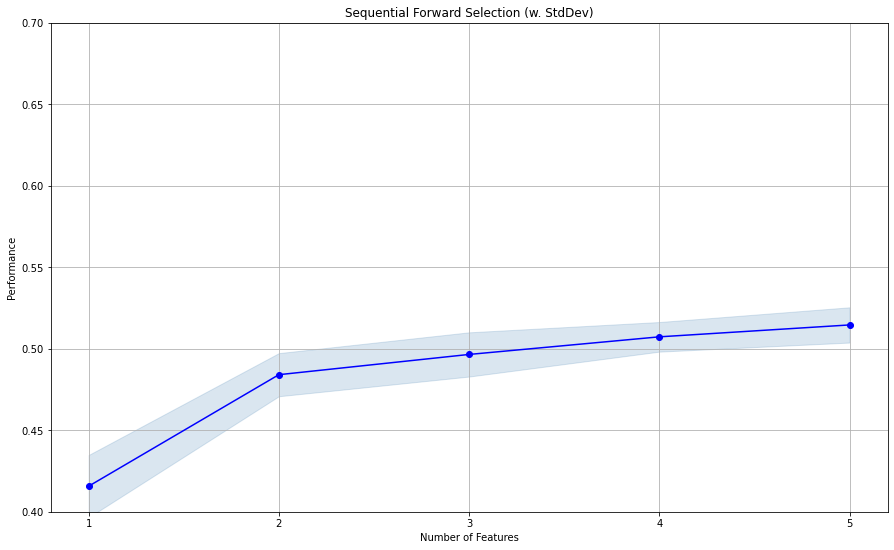

In [59]:

#Graphing how much our features predict our target variable as we add them.
plt.figure()

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev', figsize=(15, 9))



plt.ylim([0.40, 0.7])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [60]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4]


In [61]:
# let us look at the names of the important features
x_train.columns[feat_cols]

Index(['Year', 'Kilometers_Driven', 'Engine', 'Power', 'Seats'], dtype='object')

In [62]:
x_train_final = x_train[x_train.columns[feat_cols]]

# Creating new x_test with the same 5 variables that we selected for x_train
x_test_final = x_test[x_train_final.columns]

# Fitting linear model
lin_reg_model3 = LinearRegression()
lin_reg_model3.fit(x_train_final, y_train)

LinearRegression()

In [63]:
#Listing the coefficients of each feature should give us an idea of their importance.
coef_df = pd.DataFrame(
    np.append(lin_reg_model3.coef_.flatten(), lin_reg_model3.intercept_),
    index=x_train_final.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Year,0.439351
Kilometers_Driven,0.000012
Engine,-0.002669
Power,-0.016273
Seats,-1.056252
Intercept,-855.211974


In [64]:
# model performance on training set


print("Training Performance\n")
display(model_perf(lin_reg_model3, x_train_final, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model3, x_test_final, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,2.901324,2.282286,0.516096,0.515514




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,2.93584,2.306754,0.507932,0.506549


That's not a great R2 but I don't think we've substantially overfit the data. Using this will probably still be better than just using a straight mean/median replacement. Now I am going to use the regression to replace the 0 Mileages found in the original df, similarly to how I did it with the missing values.

In [65]:
#Looping through each instance where there is an Engine value but not a Power value
for i,x in carz.iterrows():
    #We only want to replace the 0 values
    if carz.at[i,'Mileage']==0:
        #Now we have to plug in values only also present in the regression model
        carz.at[i,'Mileage'] = float(lin_reg_model3.predict([[carz.at[i,'Year'],
                                                              carz.at[i,"Kilometers_Driven"],
                                                             carz.at[i,'Engine'],
                                                             carz.at[i,'Power'],
                                                             carz.at[i,'Seats']]]))

In [66]:
#Test to see if mileage was successfully replaced.
carz.iloc[14]

Name                 Land Rover Freelander 2 TD4 SE
Location                                       Pune
Year                                           2012
Kilometers_Driven                             85000
Fuel_Type                                    Diesel
Transmission                              Automatic
Owner_Type                                   Second
Mileage                                   16.808501
Engine                                       2179.0
Power                                         115.0
Seats                                           5.0
Price                                          17.5
Name: 14, dtype: object

In [67]:
#Let's compare number 14 with the other Land Rover Freelanders
data[(data['Name'].str.startswith('Land Rover Freelander')) 
     & (data['Mileage']!='0.0 kmpl')].head(5)

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
701,701,Land Rover Freelander 2 SE,Chennai,2011,109000,Diesel,Automatic,First,12.39 kmpl,2179 CC,147.51 bhp,5.0,NaN,16.50
1204,1204,Land Rover Freelander 2 HSE,Hyderabad,2012,96000,Diesel,Automatic,First,12.35 kmpl,2179 CC,187.74 bhp,5.0,NaN,18.98
1988,1988,Land Rover Freelander 2 SE,Mumbai,2012,34000,Diesel,Automatic,First,12.39 kmpl,2179 CC,147.51 bhp,5.0,NaN,19.25
3410,3410,Land Rover Freelander 2 HSE SD4,Ahmedabad,2012,60000,Diesel,Automatic,Second,12.35 kmpl,2179 CC,187.74 bhp,5.0,NaN,23.50
4247,4247,Land Rover Freelander 2 SE,Ahmedabad,2012,75000,Diesel,Automatic,Second,12.39 kmpl,2179 CC,147.51 bhp,5.0,NaN,17.50


I called on the original, unaltered data so we can see how it looked before we made any changes. The Land Rover index 14, which previously had 0 mileage, now has 14, which is pretty close to the values for the other Land Rover Freelanders that didn't have zero (all of which are about 12.4). I'll call this a success.

If the 0 Mileage values were more than 1% of the data I would have performed a more rigorous imputation, and probably done the imputation after I complete all of my feature engineering. Clearly, as we can see from the above data, the brand of the car is very helpful in predicting the Mileage. As it is, I think this will work well enough.

Now that is taken care of, I want to check for outliers in the other direction.

In [68]:
#Pulling the quartiles
quartiles = np.quantile(carz['Mileage'][carz['Mileage'].notnull()],[.25,.75])
#Multiplying quartiles by 2 for an extended 'whisker'
power_2iqr = 2 * (quartiles[1] - quartiles[0])
#printing our quartiles for reference
print(f'The quartiles for Mileage are the following: Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 2*IQR = {power_2iqr}')
#Identifying which values are outside even 2*IQR
outlier_miles = carz.loc[np.abs(carz['Mileage'] - carz['Mileage'].median()) >
                       power_2iqr, 'Mileage']

outlier_miles.sort_values(ascending = False)

The quartiles for Mileage are the following: Q1 = 15.3, Q3 = 21.1, 2*IQR = 11.600000000000001


1332    33.54
2059    33.54
2371    33.54
3129    33.54
4141    33.54
1269    33.44
3553    33.44
3869    33.44
4769    33.44
3119    32.26
5935    32.26
2701    31.79
5178    31.79
5710    30.46
5781     6.40
Name: Mileage, dtype: float64

In [69]:
#Let's take a look at those cars overall.
df_miles = pd.DataFrame(outlier_miles)
big_miles = []
for i,x in carz.iterrows():
    if i in list(outlier_miles.index):
        big_miles.append(carz.loc[i])
df_miles = pd.DataFrame(big_miles)
df_miles

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
1269,Maruti Alto 800 2016-2019 CNG LXI,Mumbai,2018,10600,CNG,Manual,First,33.44,796.0,40.30,4.0,3.50
1332,Maruti Wagon R CNG LXI,Pune,2013,79494,CNG,Manual,First,33.54,998.0,67.04,5.0,2.96
2059,Maruti Wagon R CNG LXI,Mumbai,2013,54000,CNG,Manual,First,33.54,998.0,67.04,5.0,3.05
2371,Maruti Wagon R CNG LXI,Pune,2014,29202,CNG,Manual,First,33.54,998.0,67.04,5.0,3.90
2701,Maruti Celerio CNG VXI MT,Kochi,2016,70536,CNG,Manual,First,31.79,998.0,58.33,5.0,4.58
3119,Maruti Alto K10 LXI CNG Optional,Kochi,2018,44202,CNG,Manual,First,32.26,998.0,58.20,4.0,4.00
3129,Maruti Wagon R CNG LXI,Delhi,2014,74663,CNG,Manual,First,33.54,998.0,67.04,5.0,3.25
3553,Maruti Alto 800 2016-2019 CNG LXI,Pune,2015,18000,CNG,Manual,First,33.44,796.0,40.30,4.0,3.00
3869,Maruti Alto 800 2016-2019 CNG LXI,Delhi,2012,65537,CNG,Manual,Second,33.44,796.0,40.30,4.0,2.10
4141,Maruti Wagon R CNG LXI,Mumbai,2014,47200,CNG,Manual,First,33.54,998.0,67.04,5.0,2.85


It seems to me that Maruti just have killer mileage. I do note that the high end mileages are mostly CNG, and as I previously mentioned the conversion to mileage introduced a great deal of error. I would be interested to see if this problem went away if we fixed the Mileage variable. But we won't, so I'll just leave them.

As for the Lamborghini, there is only one Lamborghini in the set, so there is nothing to compare it with. [I looked up its technical specs](#https://www.fueleconomy.gov/feg/bymodel/2014_Lamborghini_Gallardo.shtml), though, and this car should have 15MPG, which is about 6.38 kmpl. No error here.

### Price Outliers

I want to check Price for errors, even if I am hesitant to remove outliers. Price is extremely skewed, so I have to really up the multiplier for the IQR to identify values that could just be ridiculous. 

In [70]:
#Pulling the quartiles
quartiles = np.quantile(carz['Price'][carz['Price'].notnull()],[.25,.75])
#Multiplying quartiles by 10 for an extended 'whisker'
power_10iqr = 10 * (quartiles[1] - quartiles[0])
#printing our quartiles for reference
print(f'The quartiles for Price are the following: Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 10*IQR = {power_10iqr}')
#Identifying which values are outside even 10*IQR
outlier_miles = carz.loc[np.abs(carz['Price'] - carz['Price'].median()) >
                       power_10iqr, 'Price']
outlier_miles.sort_values(ascending = False)

The quartiles for Price are the following: Q1 = 3.5, Q3 = 9.95, 10*IQR = 64.5


4079    160.00
5781    120.00
5919    100.00
1505     97.07
1974     93.67
1984     93.00
4691     90.00
5535     85.00
2095     83.96
2422     79.00
1885     79.00
2319     78.80
2659     75.00
2907     75.00
3489     75.00
655      75.00
1583     72.94
5603     72.00
418      70.99
1690     70.80
3752     70.66
282      70.36
2541     70.15
Name: Price, dtype: float64

At 10* IQR these values are waaaaay out there. But, I at least reduced them enough for manual review. Let's check em out.

In [71]:
#Let's take a look at those cars overall.
df_miles = pd.DataFrame(outlier_miles)
big_miles = []
for i,x in carz.iterrows():
    if i in list(outlier_miles.index):
        big_miles.append(carz.loc[i])
df_miles = pd.DataFrame(big_miles)
#Sorting by most expensive.
df_miles.sort_values(by= 'Price',ascending=False).head(10)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
4079,Land Rover Range Rover 3.0 Diesel LWB Vogue,Hyderabad,2017,25000,Diesel,Automatic,First,13.33,2993.0,255.00,5.0,160.00
5781,Lamborghini Gallardo Coupe,Delhi,2011,6500,Petrol,Automatic,Third,6.40,5204.0,560.00,2.0,120.00
5919,Jaguar F Type 5.0 V8 S,Hyderabad,2015,8000,Petrol,Automatic,First,12.50,5000.0,488.10,2.0,100.00
1505,Land Rover Range Rover Sport SE,Kochi,2019,26013,Diesel,Automatic,First,12.65,2993.0,255.00,5.0,97.07
1974,BMW 7 Series 740Li,Coimbatore,2018,28060,Petrol,Automatic,First,12.05,2979.0,320.00,5.0,93.67
1984,BMW 7 Series 740Li,Bangalore,2017,17465,Petrol,Automatic,First,12.05,2979.0,320.00,5.0,93.00
4691,Mercedes-Benz SLK-Class 55 AMG,Bangalore,2014,3000,Petrol,Automatic,Second,12.00,5461.0,421.00,2.0,90.00
5535,BMW X6 xDrive 40d M Sport,Ahmedabad,2015,97003,Diesel,Automatic,First,15.87,2993.0,308.43,5.0,85.00
2095,Mercedes-Benz SLC 43 AMG,Coimbatore,2019,2526,Petrol,Automatic,First,19.00,2996.0,362.07,2.0,83.96
2422,Jaguar XJ 3.0L Portfolio,Delhi,2016,12000,Diesel,Automatic,First,10.50,2993.0,271.23,4.0,79.00


All of those cars are high-end luxury cars. Is anyone surprised the Lamborghini is so expensive? I'm going to leave all of these values as-is, though with skew this bad I'll be sure to log transform Price in feature engineering.

Next I want to make sure there are no 0 priced cars.

In [72]:
carz[carz['Price']==0]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price


Nope! Good.

### Engine Outliers

I have a feeling Engine is fine, but I want to be thorough so I'm going to call up the extreme values of Engine and maybe manually check one or two.

In [73]:
#Pulling the quartiles
quartiles = np.quantile(carz['Engine'][carz['Engine'].notnull()],[.25,.75])
#Multiplying quartiles by 4 for an extended 'whisker'
power_4iqr = 4 * (quartiles[1] - quartiles[0])
#printing our quartiles for reference
print(f'The quartiles for Engine are the following: Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 4*IQR = {power_4iqr}')
#Identifying which values are outside 4*IQR
outlier_miles = carz.loc[np.abs(carz['Engine'] - carz['Engine'].median()) >
                       power_4iqr, 'Engine']
outlier_miles.sort_values(ascending = False)

The quartiles for Engine are the following: Q1 = 1198.0, Q3 = 1969.0, 4*IQR = 3084.0


5521    5998.0
152     5461.0
4691    5461.0
4722    5461.0
5781    5204.0
5088    5000.0
5919    5000.0
4451    4951.0
70      4806.0
2100    4806.0
2978    4806.0
5603    4806.0
Name: Engine, dtype: float64

In [74]:
#Let's take a look at those cars overall.
df_miles = pd.DataFrame(outlier_miles)
big_miles = []
for i,x in carz.iterrows():
    if i in list(outlier_miles.index):
        big_miles.append(carz.loc[i])
df_miles = pd.DataFrame(big_miles)
#Sorting by most expensive.
df_miles.sort_values(by= 'Engine',ascending=False)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
5521,Bentley Continental Flying Spur,Hyderabad,2006,48000,Petrol,Automatic,First,8.60,5998.0,552.0,4.0,59.00
152,Mercedes-Benz S Class 2005 2013 S 500,Kolkata,2010,35277,Petrol,Automatic,First,7.81,5461.0,362.9,5.0,30.00
4691,Mercedes-Benz SLK-Class 55 AMG,Bangalore,2014,3000,Petrol,Automatic,Second,12.00,5461.0,421.0,2.0,90.00
4722,Mercedes-Benz SL-Class SL 500,Kolkata,2010,35000,Petrol,Automatic,First,8.10,5461.0,387.3,2.0,29.50
5781,Lamborghini Gallardo Coupe,Delhi,2011,6500,Petrol,Automatic,Third,6.40,5204.0,560.0,2.0,120.00
5088,Jaguar XJ 5.0 L V8 Supercharged,Coimbatore,2011,43686,Petrol,Automatic,First,10.50,5000.0,503.0,4.0,50.66
5919,Jaguar F Type 5.0 V8 S,Hyderabad,2015,8000,Petrol,Automatic,First,12.50,5000.0,488.1,2.0,100.00
4451,Ford Mustang V8,Kochi,2018,21290,Petrol,Automatic,First,13.00,4951.0,395.0,4.0,56.80
70,Porsche Cayenne 2009-2014 Turbo,Mumbai,2008,73000,Petrol,Automatic,First,8.50,4806.0,500.0,5.0,14.50
2100,Porsche Cayenne Turbo S,Mumbai,2010,35000,Petrol,Automatic,Second,11.90,4806.0,550.0,5.0,32.00


I manually checked Bentley Continental Flying Spur, Jaguar XJ 5.0 L V8 Supercharged, and Porsche Panamera 2010 2013 Diesel. All of the specs I found were identical to the specs here. I think these are just powerful cars.

## Feature Engineering

### Name to Brand and Luxury

The Name column right now contains too much information, it's really not usable as-is. The question becomes "How can we extract useful information from this column?"

I think two major pieces of information will be most applicable: What is the brand of the car, and is the car a luxury car?

Therefore, I will be isolating brand name from the name of the car and making a separate column for it.

In [75]:
#Strip out the first word of the car name to identify its brand
brand_list = []
for name in carz['Name']:
    brand_list.append(name.split(' ')[0])
carz['Brand']=brand_list #let's make this its own column
pd.Series(brand_list).value_counts(dropna=False) #I want to check how many unique values there are

Maruti           1211
Hyundai          1107
Honda             608
Toyota            410
Mercedes-Benz     318
Volkswagen        315
Ford              300
Mahindra          271
BMW               267
Audi              236
Tata              186
Skoda             173
Renault           145
Chevrolet         121
Nissan             91
Land               60
Jaguar             40
Fiat               28
Mitsubishi         27
Mini               26
Volvo              21
Porsche            18
Jeep               15
Datsun             13
Force               3
ISUZU               2
Isuzu               1
Lamborghini         1
Bentley             1
Ambassador          1
Smart               1
dtype: int64

I note that several of the smaller brand names are technically owned and produced by the larger companies. Given that they have only a small number of entries anyway, I'm going to combine them into their parent company in as many cases as possible.

However, I also think that some of these smaller brands contain potentially useful information. For example, "Porsche" may raise the price simply with its name, but it is a brand owned by Volkswagen. So, in addition to re-sorting the brand names, I am going to create a new categorical variable to account for luxury cars. I'll have to do this before folding the brands together.

In [76]:
#Making new luxury variable
carz["Luxury"] = carz['Brand']

In [77]:
#Sorting brands by luxury vs. not luxury. I'm getting my list of luxury cars from Wikipedia.
luxury_cars = ['BMW' , 'Porsche' , 'Mercedes-Benz', 'Bentley',
         'Lamborghini','Audi' , 'Jaguar' , 'Land' , 'Volvo' ,'Ambassador']
#Is luxury will become 1, not luxury is 0.
carz.loc[(carz.Luxury.isin(luxury_cars)==False),'Luxury']=0
carz.loc[(carz.Luxury.isin(luxury_cars)==True),'Luxury']=1

In [78]:
#Just double checking it worked
carz['Luxury'].value_counts()

0    5054
1     963
Name: Luxury, dtype: int64

Now we can fold cars into their parent companies.

In [79]:
#The following brands can be folded into one another based on parent company.
carz['Brand'] = carz['Brand'].replace({'Land':'Tata', 'Jaguar':'Tata', 'Lamborghini':'Volkswagen',
                                      'Mini':'BMW','Jeep':'Chrysler','Fiat':'Chrysler',
                                      'Porsche':'Volkswagen','ISUZU':'Isuzu','Bentley':'Volkswagen',
                                      'Audi':'Volkswagen','Skoda':'Volkswagen'})

In [80]:
#Let's check again to see how many categories we have
carz['Brand'].value_counts()

Maruti           1211
Hyundai          1107
Volkswagen        744
Honda             608
Toyota            410
Mercedes-Benz     318
Ford              300
BMW               293
Tata              286
Mahindra          271
Renault           145
Chevrolet         121
Nissan             91
Chrysler           43
Mitsubishi         27
Volvo              21
Datsun             13
Isuzu               3
Force               3
Ambassador          1
Smart               1
Name: Brand, dtype: int64

That's still too many, I'll end up overfitting. Time to make an 'Other" category. There is a big drop-off from Mahindra to Renault and if I cut there then I happen to put about 80% of the cars into non-other categories. Should be good. We can expand later if needed.

In [81]:
#Putting smaller brands into the Other category
carz['Brand'] = carz['Brand'].replace({'Renault':'Other','Chevrolet':'Other','Nissan':'Other',
                                      'Chrysler':'Other','Mitsubishi':'Other','Volvo':'Other',
                                      'Datsun':'Other','Isuzu':'Other','Force':'Other',
                                       'Ambassador':'Other','Smart':'Other','OpelCorsa':'Other',
                                      'Hindustan':'Other'})

In [82]:
#Checking the unique values again
carz['Brand'].value_counts()

Maruti           1211
Hyundai          1107
Volkswagen        744
Honda             608
Other             469
Toyota            410
Mercedes-Benz     318
Ford              300
BMW               293
Tata              286
Mahindra          271
Name: Brand, dtype: int64

That looks much better. If I one-hot this, I think it much less likely to overfit via complexity. I'll do that after the EDA.

### Seats

We noted before, we saw that some cars had zero seats. That makes no sense.
We also want to see if Seats would be better as a categorical variable rather than a numerical variable. We'll want to make a categorical version of Seats so that we can test which method produces a better model.

To that end, I want to see what's going on with the zero seats. Then I need to make another column which uses Seats as a category.

In [83]:
#Let's take a look at how many cars have how many seats.
carz.Seats.value_counts()

5.0     5053
7.0      674
8.0      134
4.0       99
6.0       32
2.0       16
10.0       5
9.0        3
0.0        1
Name: Seats, dtype: int64

In [84]:
#Only one car has 0 seats. This is probably an error I can just manually fix.
carz[carz['Seats']==0]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,Brand,Luxury
3999,Audi A4 3.2 FSI Tiptronic Quattro,Hyderabad,2012,125000,Petrol,Automatic,First,10.5,3197.0,234.268419,0.0,18.0,Volkswagen,1


According to [ultimatespecs.com](#https://www.ultimatespecs.com/car-specs/Audi/23542/Audi-A4-(B8)-32-FSI-quattro-tiptronic.html) this model of car has 5 seats. I'm just going to fix it.

In [85]:
# .at lets me target that cell specifically.
carz.at[3999,'Seats'] = 5

In [86]:
# Double checking to see if the seats is 5 now.
carz.iloc[3999]

Name                 Audi A4 3.2 FSI Tiptronic Quattro
Location                                     Hyderabad
Year                                              2012
Kilometers_Driven                               125000
Fuel_Type                                       Petrol
Transmission                                 Automatic
Owner_Type                                       First
Mileage                                           10.5
Engine                                          3197.0
Power                                       234.268419
Seats                                              5.0
Price                                             18.0
Brand                                       Volkswagen
Luxury                                               1
Name: 3999, dtype: object

With that taken care of, I think it best to make Seats into a categorical variable. Honestly, the vast majority of values are 5. There's a few ways to do this. I could just use it as is but that adds a lot of columns to the model for not a lot of gain. I could make it a binary column of 5 or not 5 seats, or I could separate the Seats into <5, 5, and >5. The second would offer more meaningful advice to businesses.

In [87]:
#Making both new columns for later analysis comparisons.
carz['Seats_!=5'] = carz['Seats']
carz['Seats_cat'] = carz['Seats']

In [88]:
#First making Seats_!=5 a binary. 1 = is five, 0 = not five.
for i,x in carz.iterrows():
    if carz.at[i,'Seats_!=5'] == 5:
        carz.at[i,'Seats_!=5'] = 1
    else:
        carz.at[i,'Seats_!=5'] = 0
        
carz['Seats_!=5'] = carz['Seats_!=5'].replace({1:'Five', 0:'Not Five'})
#Now converting the whole column to a category since it is no longer a float.        
carz['Seats_!=5'] = carz['Seats_!=5'].astype('category')

In [89]:
#Setting the floats to specific numbers
for i,x in carz.iterrows():
    if float(carz.at[i,'Seats_cat']) < 5.0:
        carz.at[i,'Seats_cat'] = 0
    if float(carz.at[i,'Seats_cat']) > 5.0:
        carz.at[i,'Seats_cat'] = 2
    elif float(carz.at[i,'Seats_cat']) == 5.0:
        carz.at[i,'Seats_cat'] = 1
#Then turning those numbers into categories
carz['Seats_cat'] = carz['Seats_cat'].replace({0:'Seats <5', 1:'Five Seats', 2:'Seats >5'})

In [90]:
#Now converting the column to the proper category type.
carz['Seats_cat'] = carz['Seats_cat'].astype('category')

With that, Seats should be ready for future analyses either as a category and as a numerical column.

### Location
The location variable should be examined too, I may want to trim the number of categories here.

In [91]:
# Finding how many cars are from which locations
carz['Location'].value_counts()

Mumbai        789
Hyderabad     742
Kochi         651
Coimbatore    636
Pune          622
Delhi         554
Kolkata       535
Chennai       493
Jaipur        413
Bangalore     358
Ahmedabad     224
Name: Location, dtype: int64

That actually looks pretty evenly spread. I don't think I can adjust it much. Let's leave it as-is.

### Transmission
Same for Transmission. Let's take a look at it to make sure it's OK.

In [92]:
# Finding types of transmission and how many cars are each.
carz['Transmission'].value_counts()

Manual       4299
Automatic    1718
Name: Transmission, dtype: int64

Nothing strange, very straightforward. No changes needed.

### Owner_Type
Now let's look at Owner_Type

In [93]:
#Finding how many owners have owned a given car.
carz['Owner_Type'].value_counts()

First             4927
Second             968
Third              113
Fourth & Above       9
Name: Owner_Type, dtype: int64

Nothing strange. No changes needed.

## Fuel_Type
Let's double check Fuel-Type to see if any changes are needed.

In [94]:
#Checking types of fuel and how many cars are in each category
carz['Fuel_Type'].value_counts()

Diesel    3205
Petrol    2746
CNG         56
LPG         10
Name: Fuel_Type, dtype: int64

Nothing strange. No changes needed.

## Year
Let's look at Year.

In [95]:
#Finding how many cars are made in a given year.
carz['Year'].value_counts()

2014    797
2015    744
2016    740
2013    649
2017    587
2012    580
2011    465
2010    342
2018    298
2009    198
2008    174
2007    125
2019    102
2006     78
2005     57
2004     31
2003     17
2002     15
2001      8
1998      4
2000      4
1999      2
Name: Year, dtype: int64

Because of how Year functions we could use it as a category or we can use it as a numerical variable. I favor the latter approach because an increase or decrease is meaningful, and because there is a great deal of spread throughout the years I think if we were to use it as-is we'll find good utility. If it were almost entirely one year then I'd collapse it like we did with Seats and test that too.

# Exploratory data analysis

## Univariate analyses

In [96]:
#Summarizing the numerical features
carz.describe().T.round(1)

,count,mean,std,min,25%,50%,75%,max
Year,6017.0,2013.4,3.3,1998.0,2011.0,2014.0,2016.0,2019.0
Kilometers_Driven,6017.0,57667.2,37882.9,171.0,34000.0,53000.0,73000.0,775000.0
Mileage,6017.0,18.3,4.2,6.4,15.3,18.2,21.1,33.5
Engine,6017.0,1621.5,599.3,624.0,1198.0,1493.0,1969.0,5998.0
Power,6017.0,112.9,53.6,34.2,75.0,94.7,138.1,560.0
Seats,6017.0,5.3,0.8,2.0,5.0,5.0,5.0,10.0
Price,6017.0,9.5,11.2,0.4,3.5,5.6,10.0,160.0


After all of the outlier changes we made, things look pretty good, though several data are skewed. We'll log transform some of those.

In [97]:
#Let's take a look at the non-numerical columns too

#I am displaying the number of unique values of each non-numeric column.
num_to_display = 11 #only displaying 11, more than that and it'll be hard to read.
for colname in carz.dtypes[carz.dtypes == 'object'].index:
    val_counts = carz[colname].value_counts(dropna=False) 
    print(val_counts[:num_to_display])
    if len(val_counts) > num_to_display:
        #I need to know how many are not displayed, so I'm going to print that below.
        print(f'Only displaying {num_to_display} of {len(val_counts)} values.')
    print('\n\n')

Mahindra XUV500 W8 2WD        49
Maruti Swift VDI              45
Maruti Swift Dzire VDI        34
Honda City 1.5 S MT           34
Maruti Swift VDI BSIV         31
Hyundai i10 Sportz            30
Maruti Ritz VDi               30
Toyota Fortuner 3.0 Diesel    29
Hyundai Grand i10 Sportz      27
Honda Amaze S i-Dtech         27
Honda Brio S MT               25
Name: Name, dtype: int64
Only displaying 11 of 1874 values.



Mumbai        789
Hyderabad     742
Kochi         651
Coimbatore    636
Pune          622
Delhi         554
Kolkata       535
Chennai       493
Jaipur        413
Bangalore     358
Ahmedabad     224
Name: Location, dtype: int64



Diesel    3205
Petrol    2746
CNG         56
LPG         10
Name: Fuel_Type, dtype: int64



Manual       4299
Automatic    1718
Name: Transmission, dtype: int64



First             4927
Second             968
Third              113
Fourth & Above       9
Name: Owner_Type, dtype: int64



Maruti           1211
Hyundai          1107
Volkswage


Right now these non-numerical columns are all object type. The ones I intend to use directly in my analysis should probably be category type instead.


In [98]:
#First I select the data I want to become categories
cat_vars = ['Location','Seats_cat','Seats_!=5',
            'Owner_Type','Transmission','Fuel_Type',
            'Luxury','Brand'] #I'm not going to use Name.

#Then I change them into categorical variables instead of objects
for colname in cat_vars:
    carz[colname]=carz[colname].astype('category')

In [99]:
#Checking over the columns to ensure they're all the right types.
carz.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6017 entries, 0 to 6018
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Name               6017 non-null   object  
 1   Location           6017 non-null   category
 2   Year               6017 non-null   int64   
 3   Kilometers_Driven  6017 non-null   int64   
 4   Fuel_Type          6017 non-null   category
 5   Transmission       6017 non-null   category
 6   Owner_Type         6017 non-null   category
 7   Mileage            6017 non-null   float64 
 8   Engine             6017 non-null   float64 
 9   Power              6017 non-null   float64 
 10  Seats              6017 non-null   float64 
 11  Price              6017 non-null   float64 
 12  Brand              6017 non-null   category
 13  Luxury             6017 non-null   category
 14  Seats_!=5          6017 non-null   category
 15  Seats_cat          6017 non-null   category
dtypes: cat

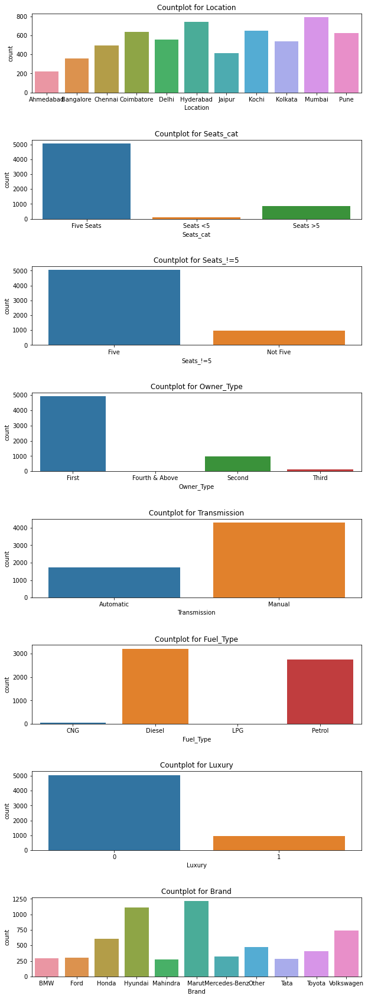

In [100]:
# Making count plots for each categorical variable just to visualize the numbers above.
plt.figure(figsize=(10,30))
pos = 1
for i in cat_vars:
    plt.subplot(8, 1, pos)
    sns.countplot(carz[i])
    plt.title(f'Countplot for {i}')
    plt.subplots_adjust(hspace = 0.6)
    pos += 1

Fuel Type is almost completely distributed between diesel and petrol. LPG and CNG are very small percentages. I think, though, with only four categories we can still use this in our model. Same goes for several other variables such as owner_type.

## Scaling and bivariate interactions

For what transformations I'll need, I'll have to look at the distributions of each variable and decide on the scaling method to use. I also want to see how each variable interacts with each other one to ensure there aren't clearly non-linear relationships.

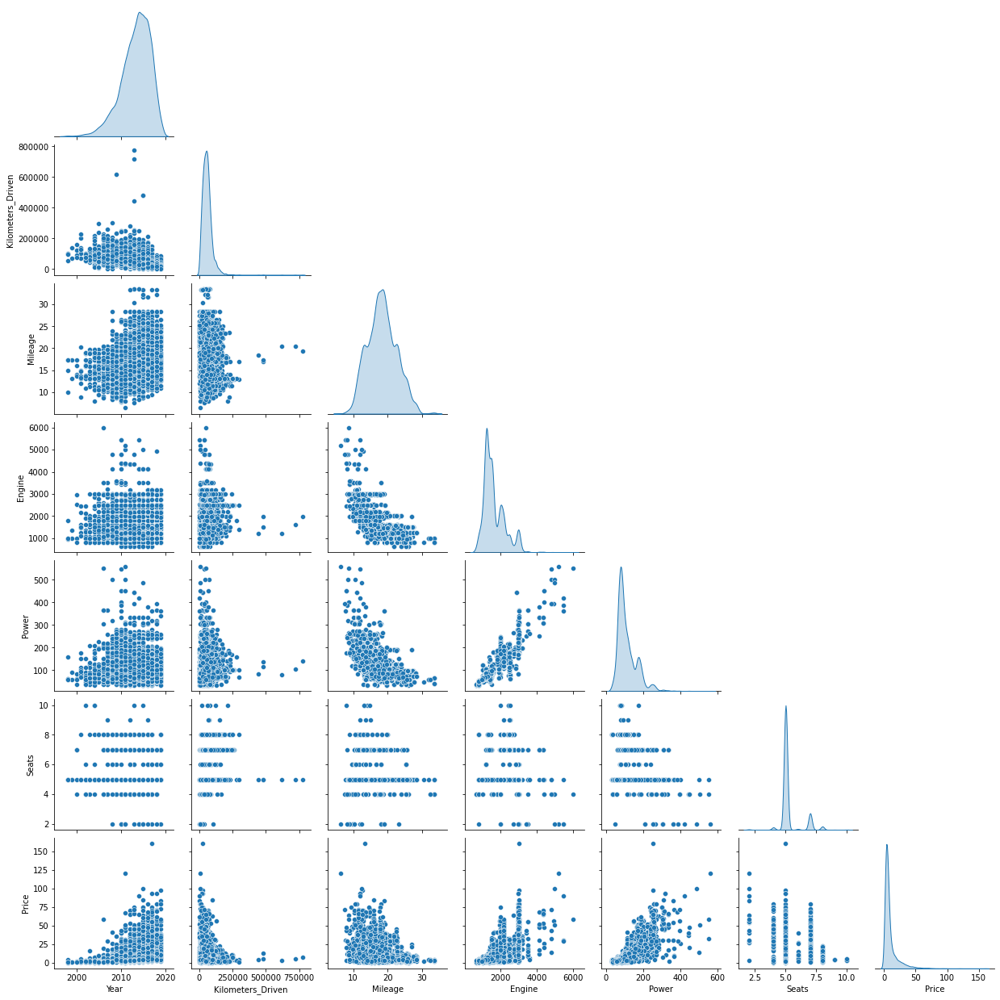

In [101]:
#A pairplot will show me distributions and scatterplots all in one place.
sns.pairplot(carz,corner=True,diag_kind='kde')

Seats is very heteroscedastic, which violates one of the assumptions of Linear Regression. I'll probably end up dropping it in favor of Seats_cat. It just doesn't make sense to log transform the number of seats.

I don't see any non-linear relationships, though I do see plenty of non-relationships or very weak relationships. I'll make a correlation heatmap later to parse that out.

That's some pretty hefty skew in KM Driven, Price, Engine, Power, and probably Year. I'll look closer at that.

In [102]:
#Checking for how skewed the data is.
#First, remove qualitative data
numcol = carz.select_dtypes(exclude=["object",'category']).columns
print(numcol)
#Now check skewness of the quantitative data
for i in numcol:
    print("Column: ",i," has skewness ",carz[i].skew()) #close to 0 is low skewness.

Index(['Year', 'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats',
       'Price'],
      dtype='object')
Column:  Year  has skewness  -0.8458910282999844
Column:  Kilometers_Driven  has skewness  4.204098231070308
Column:  Mileage  has skewness  0.21212131759522412
Column:  Engine  has skewness  1.429631316052474
Column:  Power  has skewness  1.9283937339000476
Column:  Seats  has skewness  1.9093483883203124
Column:  Price  has skewness  3.3351248546431846


Any column not between -1 and 1 is fairly skewed. Using that standard, Kilometers_Driven clearly stands out, as does Price. Engine and Power eek over the edge and should be addressed too.

Seats is skewed but I'm not sure what to do about it. Log transforming it seems weird, as the number of seats has to be a whole number. I'm going to leave it alone for now.

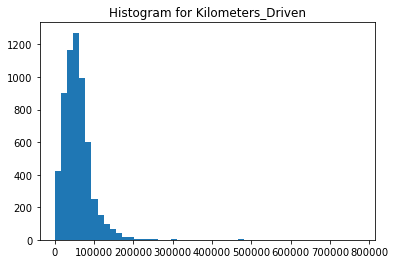

There are 0 zeroes in this column


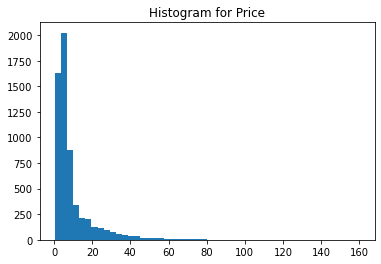

There are 0 zeroes in this column


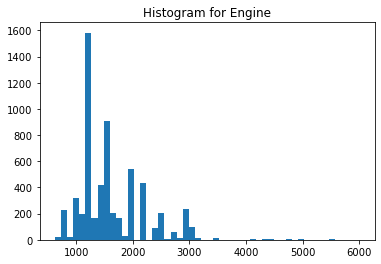

There are 0 zeroes in this column


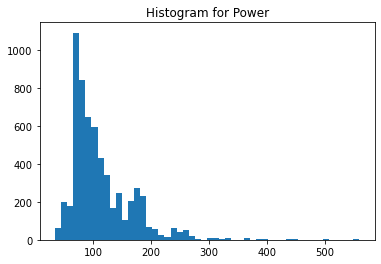

There are 0 zeroes in this column


In [103]:
#Let's get bigger graphs for those heavily skewed columns to check for 0s.
cols_to_log = ['Kilometers_Driven','Price','Engine','Power'] #Not including Seats because that's weird
for colname in cols_to_log:
    plt.hist(carz[colname],bins=50)
    plt.title(f'Histogram for {colname}')
    plt.show()
    print(f'There are {np.sum(carz[colname]<=0)} zeroes in this column') #number of 0s in the column.

None of these variables actually have any 0 values, so a log transformation can be run on them to get them to be less skewed.

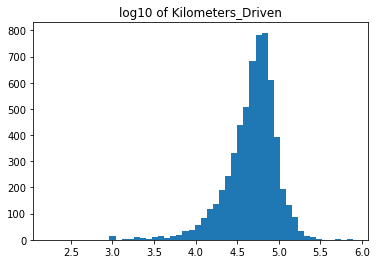

Column Kilometers_Driven has -1.3570579683795538 skewness


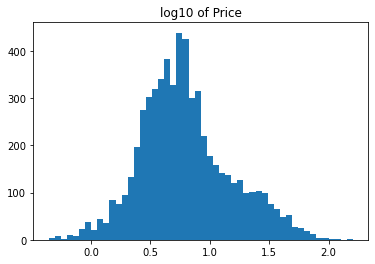

Column Price has 0.41810596002726785 skewness


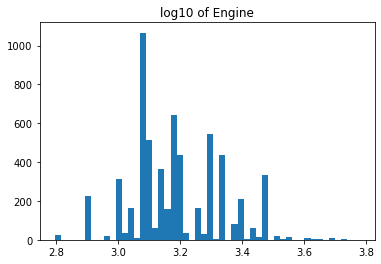

Column Engine has 0.4194176432947569 skewness


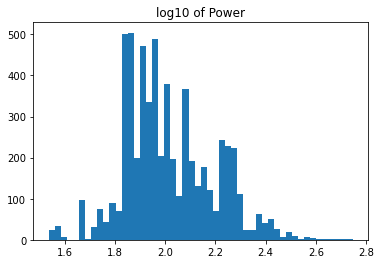

Column Power has 0.4594392984984908 skewness


In [104]:
#I will log10 each of these columns and check their new distributions
for colname in cols_to_log:
    plt.hist(np.log10(carz[colname]),bins=50)
    plt.title(f'log10 of {colname}')
    plt.show()
    print(f'Column {colname} has {np.log10(carz[colname]).skew()} skewness')

It would be optimal if all of these transformed variables had skewness between -1 and 1, but Kilometers_Driven still is not in that range even after the log. However, it's much better than 4! With our large sample size our other tests will probably be robust enough to handle the skewness of -1.30.

We don't want to drop anything yet as we may use the originals in the final algorithm. We'll drop things after initial model tests.

In [105]:
for colname in cols_to_log:
    carz[colname + '_log10']=np.log10(carz[colname]) #adding _log to the name of the columns.

In [106]:
#I am going to whip up a Pandas Profile to make sure I'm not missing any simple analyses.
pandas_profiling.ProfileReport(carz)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

I don't see any surprises, but it's nice to see a summary of what I've put together so far.

I see that Name only has 1874 distinct values, which is far fewer than the 6000+ entries we have. I wish I could use it as-is, but look at the highest numbered values: 49? 45? Each category within Name is so small that it'll just ramp up complexity and screw up the model without adding a lot of gains. I still think Brand and Luxury is the way to handle that column.

Those hexes are hard to read, I'm going to make another pairplot that includes the new log10 variables.

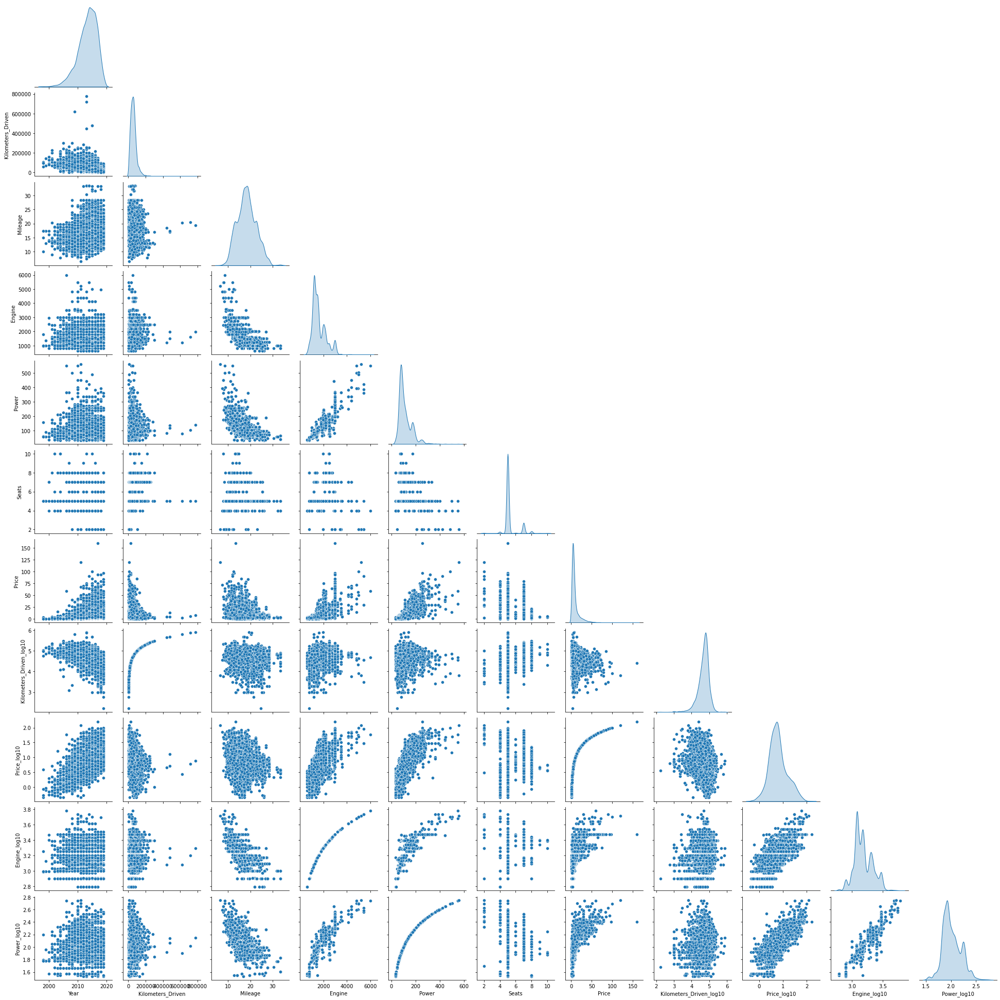

In [107]:
#Another pairplot, this time including the log10 variables.
sns.pairplot(carz,corner=True,diag_kind='kde')

Everything is looking good. Everything is mostly normally distributed, correlations are plotted, and the scatterplots don't show any blatantly non-linear relationships.

<AxesSubplot:>

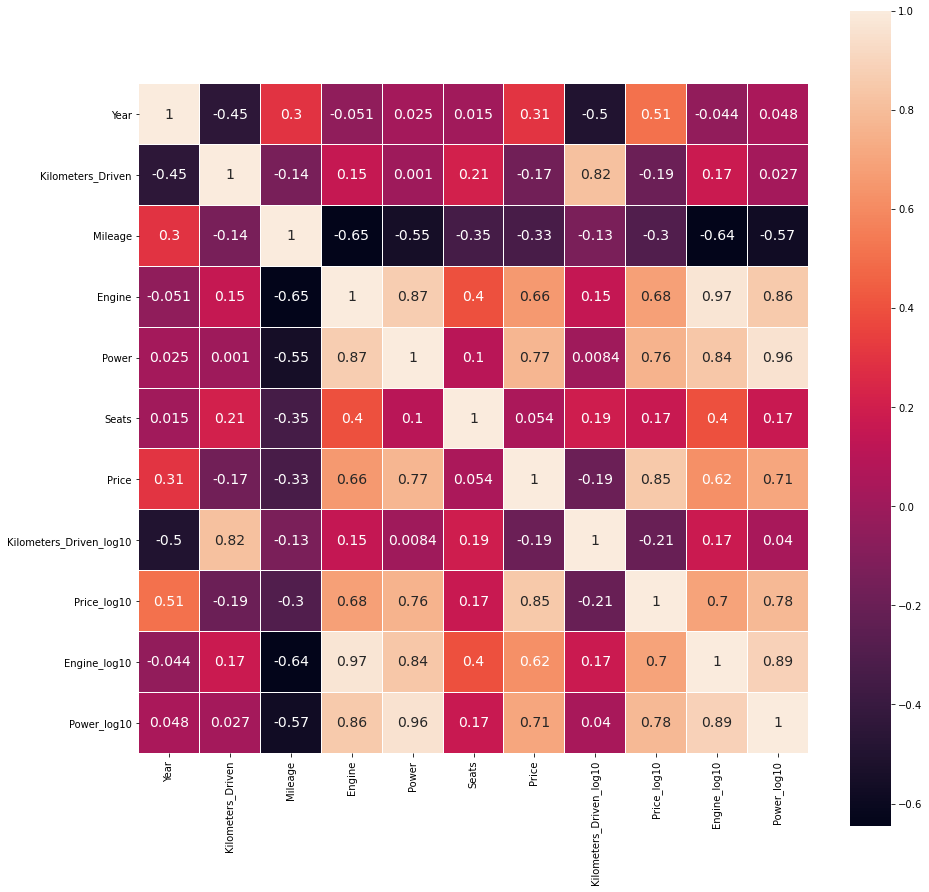

In [108]:
# Making a heatmap of the correlations between each variable.
plt.figure(figsize=(15,15))
sns.heatmap(carz.corr(), vmin=carz.corr().values.min(), vmax=1, square=True,
            linewidths=0.1, annot=True, annot_kws={"fontsize":14}) 

The log10 of each variable is highly correlated with its respective variable, as expected. Engine is related to power, which makes sense. So much so that they are fairly interchangable. Mileage, Year,  numerical Seats and Kilometers_Driven are not correlated with much else. Price and Price_log, our target variables, are correlated most strongly with Power and Engine (and their logs). I have to say I'm kind of surprised Year isn't more highly correlated with Price.

I know I already did outliers, but now I want to do a sanity check and see if these luxury cars have appropriate prices.

In [109]:
# First, what is the mean price of a luxury car and its std?
lux = carz[(carz['Luxury']==1)]
print('The Price_log10 mean for luxury cars is:')
print(lux['Price_log10'].mean())
print('The std of Price_log10 for luxury cars is:')
print(lux['Price_log10'].std())

The Price_log10 mean for luxury cars is:
1.369973454470044
The std of Price_log10 for luxury cars is:
0.2530651249855924


In [110]:
#That means these cars are lower than 99.7% of all other luxury cars.
carz[(carz['Luxury']==1) & (carz['Price_log10']<(lux['Price_log10'].mean()-3*lux['Price_log10'].std()))]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,Brand,Luxury,Seats_!=5,Seats_cat,Kilometers_Driven_log10,Price_log10,Engine_log10,Power_log10
1221,Ambassador Classic Nova Diesel,Chennai,2003,80000,Diesel,Manual,Third,12.80,1489.0,35.5,5.0,1.35,Other,1,Five,Five Seats,4.903090,0.130334,3.172895,1.550228
3132,Porsche Cayenne Base,Kochi,2019,14298,Petrol,Automatic,First,13.33,2995.0,340.0,5.0,2.02,Volkswagen,1,Five,Five Seats,4.155275,0.305351,3.476397,2.531479
3749,Mercedes-Benz E-Class 250 D W 210,Mumbai,1998,55300,Diesel,Automatic,First,10.00,1796.0,157.7,5.0,3.90,Mercedes-Benz,1,Five,Five Seats,4.742725,0.591065,3.254306,2.197832


I can swallow a 1998 car selling for that much, but a 2019 porsche? That's an outlier my previous analyses missed. I can't predict price, so I'm going to drop it.

As for the Ambassador: its power is faaaaar lower than its Engine, which is highly irregular given their .87 correlation. Because its price is also such an outlier, I think I'll be conservative and drop this value as well.

In [111]:
#Dropping the weird luxury cars
carz.drop(1221,inplace=True)
carz.drop(3132,inplace=True)

Now that all the correlations and whatnot are done, it's time to explode our number of columns by dummying the categories and to run a model to answer our question: What determines the price of a used car in India?

# Regression Modeling

We're going to simultaneously make a bunch of different models and compare them.

Should Seats be a category? If so, should it have 2 or 3 categories in it?
Should the skewed variables be log10 transformed?
Which categorical variables should be dropped?

We can find all of these out by building the models and seeing which has the best adjusted R2.

I will perform a sequential forward selection, but to ensure the same variable doesn't get inputted multiple times I have to make separate dataframes lacking duplicates. It wouldn't do for Power and Power_log to both be in the same model.

Given the duplicates I made, and the fact that I'll be dropping Name, there should be 12 columns in each df. If there isn't, I did it wrong.

In [112]:
#The set of columns after added columns for reference.
carz.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6015 entries, 0 to 6018
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Name                     6015 non-null   object  
 1   Location                 6015 non-null   category
 2   Year                     6015 non-null   int64   
 3   Kilometers_Driven        6015 non-null   int64   
 4   Fuel_Type                6015 non-null   category
 5   Transmission             6015 non-null   category
 6   Owner_Type               6015 non-null   category
 7   Mileage                  6015 non-null   float64 
 8   Engine                   6015 non-null   float64 
 9   Power                    6015 non-null   float64 
 10  Seats                    6015 non-null   float64 
 11  Price                    6015 non-null   float64 
 12  Brand                    6015 non-null   category
 13  Luxury                   6015 non-null   category
 14  Seats_!=

In [113]:
#Making a df for log transformed variables but leaving seats a number.
carz_log = carz.drop(cols_to_log, axis=1) #log transformed dropped. I'll be reusing this.
carz_log_seatnum = carz_log.drop([carz.columns[14],carz.columns[15], carz.columns[0]], axis=1)
carz_log_seatnum.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6015 entries, 0 to 6018
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Location                 6015 non-null   category
 1   Year                     6015 non-null   int64   
 2   Fuel_Type                6015 non-null   category
 3   Transmission             6015 non-null   category
 4   Owner_Type               6015 non-null   category
 5   Mileage                  6015 non-null   float64 
 6   Seats                    6015 non-null   float64 
 7   Brand                    6015 non-null   category
 8   Luxury                   6015 non-null   category
 9   Kilometers_Driven_log10  6015 non-null   float64 
 10  Price_log10              6015 non-null   float64 
 11  Engine_log10             6015 non-null   float64 
 12  Power_log10              6015 non-null   float64 
dtypes: category(6), float64(6), int64(1)
memory usage: 412.6 KB


In [114]:
#Making a df with the non-log duplicate columns dropped with seats_!=5.
carz_log_seatno5 = carz_log.drop([carz.columns[10],carz.columns[15], carz.columns[0]], axis=1)
carz_log_seatno5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6015 entries, 0 to 6018
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Location                 6015 non-null   category
 1   Year                     6015 non-null   int64   
 2   Fuel_Type                6015 non-null   category
 3   Transmission             6015 non-null   category
 4   Owner_Type               6015 non-null   category
 5   Mileage                  6015 non-null   float64 
 6   Brand                    6015 non-null   category
 7   Luxury                   6015 non-null   category
 8   Seats_!=5                6015 non-null   category
 9   Kilometers_Driven_log10  6015 non-null   float64 
 10  Price_log10              6015 non-null   float64 
 11  Engine_log10             6015 non-null   float64 
 12  Power_log10              6015 non-null   float64 
dtypes: category(7), float64(5), int64(1)
memory usage: 371.6 KB


In [115]:
#Making a df with the non-log duplicate columns dropped with seats_cat.
carz_log_seatcat = carz_log.drop([carz.columns[10],carz.columns[14], carz.columns[0]], axis=1)
carz_log_seatcat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6015 entries, 0 to 6018
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Location                 6015 non-null   category
 1   Year                     6015 non-null   int64   
 2   Fuel_Type                6015 non-null   category
 3   Transmission             6015 non-null   category
 4   Owner_Type               6015 non-null   category
 5   Mileage                  6015 non-null   float64 
 6   Brand                    6015 non-null   category
 7   Luxury                   6015 non-null   category
 8   Seats_cat                6015 non-null   category
 9   Kilometers_Driven_log10  6015 non-null   float64 
 10  Price_log10              6015 non-null   float64 
 11  Engine_log10             6015 non-null   float64 
 12  Power_log10              6015 non-null   float64 
dtypes: category(7), float64(5), int64(1)
memory usage: 371.6 KB


In [116]:
# df in the data's purest form. No logs, no seat categories
carz_nolog_seatnum = carz.drop(carz.columns[14:20], axis=1)
carz_nolog_seatnum = carz_nolog_seatnum.drop(carz_nolog_seatnum.columns[0], axis=1)
carz_nolog_seatnum.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6015 entries, 0 to 6018
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Location           6015 non-null   category
 1   Year               6015 non-null   int64   
 2   Kilometers_Driven  6015 non-null   int64   
 3   Fuel_Type          6015 non-null   category
 4   Transmission       6015 non-null   category
 5   Owner_Type         6015 non-null   category
 6   Mileage            6015 non-null   float64 
 7   Engine             6015 non-null   float64 
 8   Power              6015 non-null   float64 
 9   Seats              6015 non-null   float64 
 10  Price              6015 non-null   float64 
 11  Brand              6015 non-null   category
 12  Luxury             6015 non-null   category
dtypes: category(6), float64(5), int64(2)
memory usage: 412.6 KB


In [117]:
#Have to turn our category variables into dummies for each of our new dataframes.

#Getting the shape of all the dfs we just made.
carz_nolog_seatnum_dum = pd.get_dummies(carz_nolog_seatnum, drop_first=True)
print(f'carz_nolog_seatnum_dum shape: {carz_nolog_seatnum_dum.shape}')

carz_log_seatcat_dum = pd.get_dummies(carz_log_seatcat, drop_first=True)
print(f'carz_log_seatcat_dum shape: {carz_log_seatcat_dum.shape}')

carz_log_seatno5_dum = pd.get_dummies(carz_log_seatno5, drop_first=True)
print(f'carz_log_seatno5_dum shape: {carz_log_seatno5_dum.shape}')

carz_log_seatnum_dum = pd.get_dummies(carz_log_seatnum, drop_first=True)
print(f'carz_log_seatnum_dum shape: {carz_log_seatnum_dum.shape}')


carz_nolog_seatnum_dum shape: (6015, 35)
carz_log_seatcat_dum shape: (6015, 36)
carz_log_seatno5_dum shape: (6015, 35)
carz_log_seatnum_dum shape: (6015, 35)


Let's do a Sequential Forward Selection to choose the best models.

## carz_nolog_seatnum Regression

Let's make a model with a sane number of features, starting with no log transformations and using Seat as a number.

In [118]:
#Plugging in the df
x=carz_nolog_seatnum_dum.drop(["Price"],axis=1) #Price is dependent because we have no log Price.
y=carz_nolog_seatnum_dum["Price"]

#split the data into train and test

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7) #70:30 for training and test ratio, 80:20

lin_reg_model = LinearRegression() #Model Object

lin_reg_model.fit(x_train, y_train) #Model Training. Inputs are both dependent and independent variable


LinearRegression()

In [119]:
# Checking model performance on training set
print("Training Performance\n")
model_perf(lin_reg_model, x_train, y_train)

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.606738,3.08021,0.750998,0.74897


In [120]:
# Checking model performance on test set
print("Test Performance\n")
model_perf(lin_reg_model, x_test, y_test)

Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.353616,3.150578,0.766533,0.762048


That's very solid. Let's see if we can get even better with just these features. To do that, I want to first see which features are most impactful. I'm going to run a sequential forward selection.

In [121]:
#Making a new regression for the SFS to use
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=x_train.shape[1],
    forward=True,  # k_features denotes the number of features to select
    floating=False,
    scoring="r2",
    n_jobs=-1,  # n_jobs=-1 means all processor cores will be used
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

<Figure size 432x288 with 0 Axes>

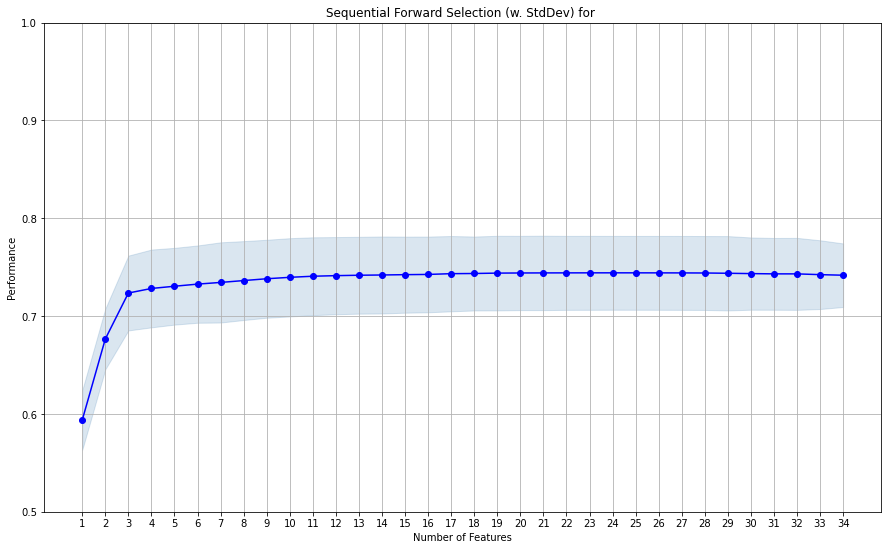

In [122]:
#Visualizing the SFS so we can see how many features are ideal.
plt.figure()

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev', figsize=(15, 9))



plt.ylim([0.50, 1.0])
plt.title('Sequential Forward Selection (w. StdDev) for ')
plt.grid()
plt.show()

Looking at that graph, I want to run two additional tests. One at 4 features and the other at 15 to see if we can reduce overfitting.
### Four Features

In [123]:
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=4, #This time we only include 4 features.
    forward=True,
    floating=False,
    scoring="r2",
    n_jobs=-1,
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

In [124]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 3, 4, 33]


In [125]:
# let us look at the names of the important features
x_train.columns[feat_cols]

Index(['Year', 'Engine', 'Power', 'Luxury_1'], dtype='object')

In [126]:
x_train_final = x_train[x_train.columns[feat_cols]]

# Creating new x_test with the same 20 variables that we selected for x_train
x_test_final = x_test[x_train_final.columns]

# Fitting linear model
lin_reg_model2 = LinearRegression()
lin_reg_model2.fit(x_train_final, y_train)

LinearRegression()

In [127]:
# model performance on train set

from IPython.display import display
print("Training Performance\n")
display(model_perf(lin_reg_model2, x_train_final, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model2, x_test_final, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.853917,3.265819,0.728559,0.728301




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.607107,3.327942,0.7439,0.743331


We see a lower adjusted R2 with only 4 features. I'm going to try 15 now.

### 15 Features

In [128]:
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=15, #This time we only include 15 features.
    forward=True,
    floating=False,
    scoring="r2",
    n_jobs=-1,
    verbose=0,
    cv=3,
)

# Perform SFFS
sfs = sfs.fit(x_train, y_train)

In [129]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 1, 3, 4, 6, 8, 10, 13, 24, 25, 26, 27, 29, 32, 33]


In [130]:
# let us look at the names of the important features
x_train.columns[feat_cols]

Index(['Year', 'Kilometers_Driven', 'Engine', 'Power', 'Location_Bangalore',
       'Location_Coimbatore', 'Location_Hyderabad', 'Location_Kolkata',
       'Brand_Honda', 'Brand_Hyundai', 'Brand_Mahindra', 'Brand_Maruti',
       'Brand_Other', 'Brand_Volkswagen', 'Luxury_1'],
      dtype='object')

In [131]:
x_train_final = x_train[x_train.columns[feat_cols]]

# Creating new x_test with the same 20 variables that we selected for x_train
x_test_final = x_test[x_train_final.columns]

# Fitting linear model
lin_reg_model3 = LinearRegression()
lin_reg_model3.fit(x_train_final, y_train)

LinearRegression()

In [132]:
# model performance on train set

from IPython.display import display
print("Training Performance\n")
display(model_perf(lin_reg_model3, x_train_final, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model3, x_test_final, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.681283,3.078688,0.744332,0.743418




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,5.42312,3.169493,0.760431,0.758423


I did try 16+ but the adjusted R2 starts going down from 15. This is the best we'll get with this df.

In [133]:
#Listing the coefficients of each feature should give us an idea of their importance.
coef_df = pd.DataFrame(
    np.append(lin_reg_model3.coef_.flatten(), lin_reg_model3.intercept_),
    index=x_train_final.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Year,0.919030
Kilometers_Driven,-0.000018
Engine,0.003303
Power,0.083090
Location_Bangalore,1.505217
Location_Coimbatore,1.958926
Location_Hyderabad,1.690419
Location_Kolkata,-1.230631
Brand_Honda,-2.138126
Brand_Hyundai,-0.961670


From now on I'm just going to manually check where adjusted R2 peaks. I just wanted to show the logic I use: Stop at the simplest model with the most gains, and then test closer to the tail to see if we've started overfitting. Trial and error until we get the best adjusted R2.

As for the coefficients, unlike my next few regressions I can actually interpret some of these because I'm predicting Price, not price_log10, and I didn't log10 any of the variables. Interestingly, though, brand really matters a lot to price. It seems like Indians like Maruti and no other brands unless it's a luxury car, then the value goes way way up. Being a luxury car straight-up adds 9 INR Lakhs to the predicted price.

Another surprising revelation is that Kilometers_Driven doesn't seem to matter hardly at all. Though I suppose at the scale we're talking it still has an impact, even at the high end of like 200,000km it only drops the predicted price by 3.6 INR Lakhs.

Still, we can do better than that adjusted R2. If this turns out to be highest, then I'll start looking at residuals and doing predicted/actual comparisons. Otherwise, this is enough.

## carz_log_seatcat_dum Regression
This mode has the log transformations but not the originals, and treats seats as a category with 3 values: <5 seats, 5 seats, or >5 seats.

In [134]:
#Plugging in the df
x=carz_log_seatcat_dum.drop(["Price_log10"],axis=1) #Price is dependent because we have no log Price.
y=carz_log_seatcat_dum["Price_log10"]

#split the data into train and test

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7) #70:30 for training and test ratio, 80:20

lin_reg_model = LinearRegression() #Model Object

lin_reg_model.fit(x_train, y_train) #Model Training. Inputs are both dependent and independent variable


LinearRegression()

In [135]:
# Checking model performance on training set
print("Training Performance\n")
model_perf(lin_reg_model, x_train, y_train)

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103407,0.076703,0.92547,0.924845


In [136]:
# Checking model performance on test set
print("Test Performance\n")
model_perf(lin_reg_model, x_test, y_test)

Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103765,0.076986,0.925857,0.92439


That is an incredible adjusted R2. Still, let's run SFS to see if we can't nudge it even higher.

In [137]:
#Making a new regression for the SFS to use
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=x_train.shape[1],
    forward=True,  # k_features denotes the number of features to select
    floating=False,
    scoring="r2",
    n_jobs=-1,  # n_jobs=-1 means all processor cores will be used
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

<Figure size 432x288 with 0 Axes>

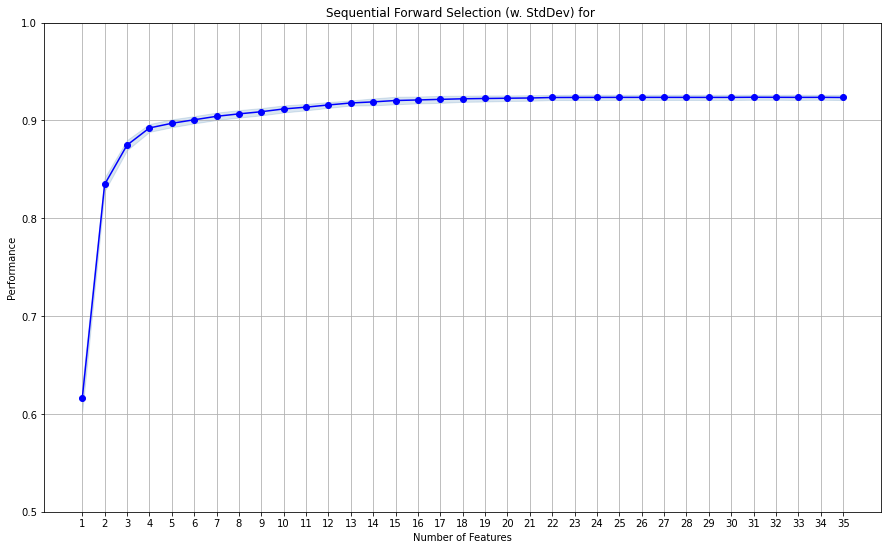

In [138]:
#Visualizing the SFS so we can see how many features are ideal.
plt.figure()

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev', figsize=(15, 9))



plt.ylim([0.50, 1.0])
plt.title('Sequential Forward Selection (w. StdDev) for ')
plt.grid()
plt.show()

Given we weren't seeing much overfit even with max features, I'll just try 35 features and go backwards.

In [139]:
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=31, #After manual trial and error, I found adjusted R2 maxes out at 31 features.
    forward=True,
    floating=False,
    scoring="r2",
    n_jobs=-1,
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

In [140]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 23, 24, 25, 26, 29, 30, 31, 32, 33, 34]


In [141]:
# let us look at the names of those important features
x_train.columns[feat_cols]

Index(['Year', 'Mileage', 'Kilometers_Driven_log10', 'Engine_log10',
       'Power_log10', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Fuel_Type_Diesel', 'Fuel_Type_LPG',
       'Fuel_Type_Petrol', 'Transmission_Manual', 'Owner_Type_Fourth & Above',
       'Owner_Type_Second', 'Brand_Honda', 'Brand_Hyundai', 'Brand_Mahindra',
       'Brand_Maruti', 'Brand_Tata', 'Brand_Toyota', 'Brand_Volkswagen',
       'Luxury_1', 'Seats_cat_Seats <5', 'Seats_cat_Seats >5'],
      dtype='object')

In [142]:
x_train_final = x_train[x_train.columns[feat_cols]]

# Creating new x_test with the same 31 variables that we selected for x_train
x_test_final = x_test[x_train_final.columns]

# Fitting linear model
lin_reg_model3 = LinearRegression()
lin_reg_model3.fit(x_train_final, y_train)

LinearRegression()

In [143]:
#I want to look at the coefficients of the features (columns) that made it in.
coef_df = pd.DataFrame(
    np.append(lin_reg_model3.coef_.flatten(), lin_reg_model3.intercept_),
    index=x_train_final.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Year,0.051624
Mileage,-0.003915
Kilometers_Driven_log10,-0.068891
Engine_log10,0.399600
Power_log10,0.735134
Location_Bangalore,0.052887
Location_Chennai,-0.001447
Location_Coimbatore,0.034636
Location_Delhi,-0.038094
Location_Hyderabad,0.046799


Because we're predicting a log10, beyond direction there is little to learn from looking at the coefficients.

In [144]:
# model performance on train set

from IPython.display import display
print("Training Performance\n")
display(model_perf(lin_reg_model3, x_train_final, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model3, x_test_final, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103686,0.076641,0.925068,0.924512




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.104008,0.076984,0.925509,0.924206


Another extremely high adjusted R2.

## carz_log_seatnum_dum Regression
This mode uses the log transformations but not their originals, and treats Seats as a numerical variable rather than as a category.

In [145]:
#Plugging in the df
x=carz_log_seatnum_dum.drop(["Price_log10"],axis=1) #Price is dependent because we have no log Price.
y=carz_log_seatnum_dum["Price_log10"]

#split the data into train and test

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7) #70:30 for training and test ratio, 80:20

lin_reg_model = LinearRegression() #Model Object

lin_reg_model.fit(x_train, y_train) #Model Training. Inputs are both dependent and independent variable


LinearRegression()

In [146]:
# Checking model performance on training set
print("Training Performance\n")
model_perf(lin_reg_model, x_train, y_train)

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.104865,0.077733,0.923355,0.92273


In [147]:
# Checking model performance on test set
print("Test Performance\n")
model_perf(lin_reg_model, x_test, y_test)

Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.105253,0.077699,0.923715,0.92225


In [148]:
#Making a new regression for the SFS to use
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=x_train.shape[1],
    forward=True,  # k_features denotes the number of features to select
    floating=False,
    scoring="r2",
    n_jobs=-1,  # n_jobs=-1 means all processor cores will be used
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_train, y_train)

<Figure size 432x288 with 0 Axes>

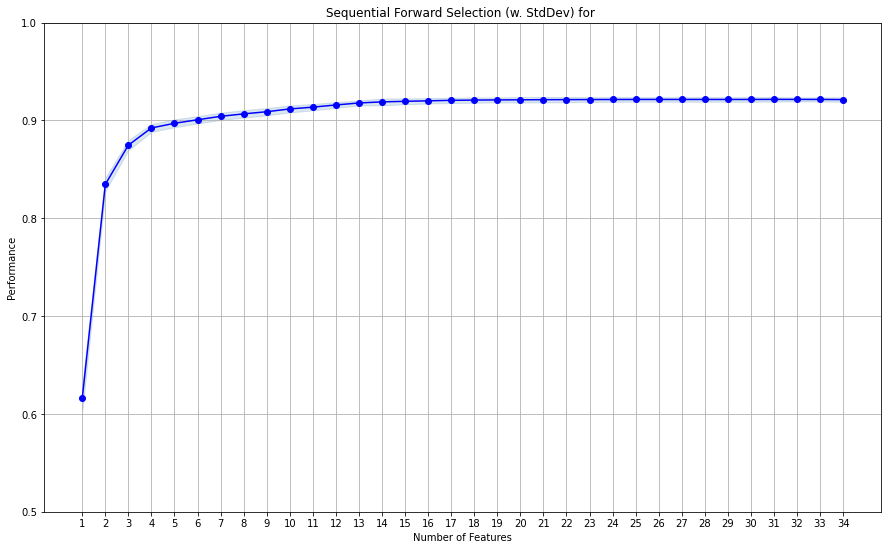

In [149]:
#Visualizing the SFS so we can see how many features are ideal.
plt.figure()

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev', figsize=(15, 9))



plt.ylim([0.50, 1.0])
plt.title('Sequential Forward Selection (w. StdDev) for ')
plt.grid()
plt.show()

In [150]:
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=30, #After manual trial and error, I found adjusted R2 maxes out at 30 features.
    forward=True,
    floating=False,
    scoring="r2",
    n_jobs=-1,
    verbose=0,
    cv=3,
)

# Perform SFFS
sfs = sfs.fit(x_train, y_train)

In [151]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 25, 26, 27, 28, 29, 30, 31, 33]


In [152]:
# let us look at the names of the important features
x_train.columns[feat_cols]

Index(['Year', 'Mileage', 'Seats', 'Kilometers_Driven_log10', 'Engine_log10',
       'Power_log10', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Kochi', 'Location_Kolkata', 'Location_Mumbai',
       'Location_Pune', 'Fuel_Type_Diesel', 'Fuel_Type_LPG',
       'Fuel_Type_Petrol', 'Transmission_Manual', 'Owner_Type_Fourth & Above',
       'Owner_Type_Second', 'Brand_Ford', 'Brand_Hyundai', 'Brand_Mahindra',
       'Brand_Maruti', 'Brand_Mercedes-Benz', 'Brand_Other', 'Brand_Tata',
       'Brand_Toyota', 'Luxury_1'],
      dtype='object')

In [153]:
x_train_final = x_train[x_train.columns[feat_cols]]

# Creating new x_test with the same 30 variables that we selected for x_train
x_test_final = x_test[x_train_final.columns]

# Fitting linear model
lin_reg_model3 = LinearRegression()
lin_reg_model3.fit(x_train_final, y_train)

LinearRegression()

In [154]:
#I want to look at the coefficients of the features (columns) that made it in.
coef_df = pd.DataFrame(
    np.append(lin_reg_model3.coef_.flatten(), lin_reg_model3.intercept_),
    index=x_train_final.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Year,0.051441
Mileage,-0.004459
Seats,0.008133
Kilometers_Driven_log10,-0.076173
Engine_log10,0.421864
Power_log10,0.729426
Location_Bangalore,0.073173
Location_Chennai,0.017570
Location_Coimbatore,0.056006
Location_Delhi,-0.016792


In [155]:
# model performance on train set

from IPython.display import display
print("Training Performance\n")
display(model_perf(lin_reg_model3, x_train_final, y_train))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_model3, x_test_final, y_test))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.105138,0.077783,0.922954,0.922401




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.105208,0.077662,0.92378,0.922491


Let's move on to the next model.

## carz_log_seatno5_dum Regression

In [156]:
#Plugging in the df
x=carz_log_seatno5_dum.drop(["Price_log10"],axis=1) #Price is dependent because we have no log Price.
y=carz_log_seatno5_dum["Price_log10"]

#split the data into train and test

x_trainb,x_testb,y_trainb,y_testb=train_test_split(x,y,test_size=0.3,random_state=7) #70:30 for training and test ratio, 80:20

lin_reg_model = LinearRegression() #Model Object

lin_reg_model.fit(x_trainb, y_trainb) #Model Training. Inputs are both dependent and independent variable


LinearRegression()

In [157]:
# Checking model performance on training set
print("Training Performance\n")
model_perf(lin_reg_model, x_trainb, y_trainb)

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103674,0.076876,0.925085,0.924475


In [158]:
# Checking model performance on test set
print("Test Performance\n")
model_perf(lin_reg_model, x_testb, y_testb)

Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103757,0.077016,0.925868,0.924444


As expected, changing seat from full categories to 5/not 5 didn't impact things much.

In [159]:
#Making a new regression for the SFS to use
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=x_trainb.shape[1],
    forward=True,  # k_features denotes the number of features to select
    floating=False,
    scoring="r2",
    n_jobs=-1,  # n_jobs=-1 means all processor cores will be used
    verbose=0,
    cv=3,
)

# Perform SFS
sfs = sfs.fit(x_trainb, y_trainb)

<Figure size 432x288 with 0 Axes>

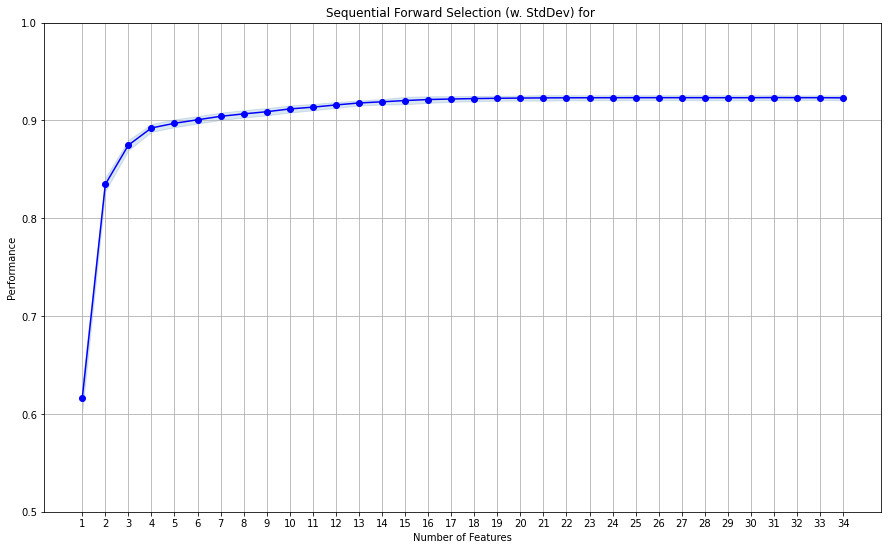

In [160]:
#Visualizing the SFS so we can see how many features are ideal.
plt.figure()

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev', figsize=(15, 9))



plt.ylim([0.50, 1.0])
plt.title('Sequential Forward Selection (w. StdDev) for ')
plt.grid()
plt.show()

It seems to start going down at around 22 features. I'll start there and see if I can finetune.

In [161]:
reg = LinearRegression()

# Build step forward feature selection
sfs = SFS(
    reg,
    k_features=23, #After manual trial and error, I found adjusted R2 maxes out at 23 features.
    forward=True,
    floating=False,
    scoring="r2",
    n_jobs=-1,
    verbose=0,
    cv=3,
)

# Perform SFFS
sfs = sfs.fit(x_trainb, y_trainb)

In [162]:
# let us select the features which are important
feat_cols = list(sfs.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4, 5, 6, 7, 9, 11, 12, 15, 18, 20, 22, 24, 25, 26, 28, 29, 30, 32, 33]


In [163]:
# let us look at the names of the important features
x_trainb.columns[feat_cols]

Index(['Year', 'Mileage', 'Kilometers_Driven_log10', 'Engine_log10',
       'Power_log10', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Hyderabad', 'Location_Kochi',
       'Location_Kolkata', 'Fuel_Type_Diesel', 'Transmission_Manual',
       'Owner_Type_Second', 'Brand_Ford', 'Brand_Hyundai', 'Brand_Mahindra',
       'Brand_Maruti', 'Brand_Other', 'Brand_Tata', 'Brand_Toyota', 'Luxury_1',
       'Seats_!=5_Not Five'],
      dtype='object')

In [164]:
x_trainb_final = x_trainb[x_trainb.columns[feat_cols]]

# Creating new x_test with the same 23 variables that we selected for x_train
x_testb_final = x_testb[x_trainb_final.columns]

# Fitting linear model
lin_reg_modelbest = LinearRegression()
lin_reg_modelbest.fit(x_trainb_final, y_trainb)

LinearRegression()

In [165]:
# model performance on train set

from IPython.display import display
print("Training Performance\n")
display(model_perf(lin_reg_modelbest, x_trainb_final, y_trainb))

# model performance on test set
print("\n\nTest Performance\n")
display(model_perf(lin_reg_modelbest, x_testb_final, y_testb))

Training Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.104081,0.077208,0.924495,0.92408




Test Performance



,RMSE,MAE,R^2,Adjusted R^2
0,0.103891,0.07713,0.925676,0.924717


This is the best score, although all of the log transformed models are very similar. Its RMSE is low and its adjusted R2 is highest. I am going to use this set of features going forward.

In [166]:
#I want to look at the coefficients of the features (columns) that made it in.
coef_df = pd.DataFrame(
    np.append(lin_reg_modelbest.coef_.flatten(), lin_reg_modelbest.intercept_),
    index=x_trainb_final.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Year,0.050955
Mileage,-0.003000
Kilometers_Driven_log10,-0.071878
Engine_log10,0.378800
Power_log10,0.744100
Location_Bangalore,0.084986
Location_Chennai,0.029715
Location_Coimbatore,0.067723
Location_Hyderabad,0.079063
Location_Kochi,0.011927


Just as a reminder, because we log10 transformed Price these coefficients are difficult to analyze directly.

As an American I am sad that being a Ford lowers the price.

### Polynomial Interaction Terms

Now that we have identified which combination of engineered columns is best (where we log10 transformed the skewed variables and made Seat into a 5/not 5 category) I want to try adding interaction terms.

In [167]:
#Set up polynomial interaction terms.
poly = PolynomialFeatures(degree=2, interaction_only=True)
X_trainb_poly = poly.fit_transform(x_trainb_final)
X_testb_poly = poly.fit_transform(x_testb_final)

poly_clf = linear_model.LinearRegression()

poly_clf.fit(X_trainb_poly, y_trainb)

print("Training Performance for poly model")
display(model_perf(poly_clf, X_trainb_poly, y_trainb)) #The data is the same as before.

# model performance on test set
print("\nTest Performance for poly model")
display(model_perf(poly_clf, X_testb_poly, y_testb))#The data is the same as before.

Training Performance for poly model


,RMSE,MAE,R^2,Adjusted R^2
0,0.086025,0.064547,0.94842,0.944787



Test Performance for poly model


,RMSE,MAE,R^2,Adjusted R^2
0,0.09571,0.07053,0.936921,0.925479


In [168]:
print(f'The poly model has {X_testb_poly.shape[1]} columns, substantially more than the original {x_trainb_final.shape[1]}.')

The poly model has 277 columns, substantially more than the original 23.


The polynomial interaction terms failed to improve the model, though it did lower the RMSE, so I'm going to leave them out moving forward. The Adjusted R2 went down. It's not worth the added complexity. I won't be using these.

### Actual vs. Predicted values

I want to do a sanity check on my model just to double-check everything is working well. Then, I need to make some concrete business recommendations for used car dealers.

In order to give more concrete advice to car dealers, I want to give them a range. To that end, using the features I identified above, I'm going to build gradient regressions to give us an error range.

In [169]:
# Set lower and upper quantile
LOWER_ALPHA = 0.1
UPPER_ALPHA = 0.9
# Each model has to be separate
lower_model = GradientBoostingRegressor(loss="quantile",                   
                                        alpha=LOWER_ALPHA)
# The mid model will use the default loss
mid_model = GradientBoostingRegressor(loss="ls")
upper_model = GradientBoostingRegressor(loss="quantile",
                                        alpha=UPPER_ALPHA)

In [170]:
# Fit models
lower_model.fit(x_trainb_final, y_trainb) #Using the same data and features as the linear model
mid_model.fit(x_trainb_final, y_trainb)
upper_model.fit(x_trainb_final, y_trainb)
# Record actual values on test set
predictions = pd.DataFrame(10**y_testb) #undoing the log so we can make sense of things
# Predict
predictions['lower'] = 10**lower_model.predict(x_testb_final)
predictions['mid'] = 10**mid_model.predict(x_testb_final)
predictions['upper'] = 10**upper_model.predict(x_testb_final)
#Changing name to reflect the undone log
predictions.rename(columns={'Price_log10':'Price'},inplace=True) 
predictions

,Price,lower,mid,upper
5985,3.88,3.746191,5.403782,6.567600
5788,4.80,4.913209,5.740302,7.434465
5679,10.00,7.311023,10.177242,12.138409
1421,2.80,2.786939,3.136985,3.612640
2752,2.50,2.718587,2.833556,3.719307
...,...,...,...,...
1382,1.69,1.490019,1.794818,2.393142
1494,5.80,5.987428,8.269085,9.997461
4731,4.00,3.434168,3.869409,5.355347
4499,12.99,6.011218,10.858285,14.928168


Let's see how these models perform compared to our previous linear regression.

In [171]:
print("Training Performance for lower model")
display(model_perf(lower_model, x_trainb_final, y_trainb)) #The data is the same as before.

# model performance on test set
print("\nTest Performance for lower model")
display(model_perf(lower_model, x_testb_final, y_testb))#The data is the same as before.

print("Training Performance for mid model")
display(model_perf(mid_model, x_trainb_final, y_trainb)) #The data is the same as before.

# model performance on test set
print("\nTest Performance for mid model")
display(model_perf(mid_model, x_testb_final, y_testb))#The data is the same as before.


print("Training Performance for upper model")
display(model_perf(upper_model, x_trainb_final, y_trainb)) #The data is the same as before.

# model performance on test set
print("\nTest Performance for upper model")
display(model_perf(upper_model, x_testb_final, y_testb))#The data is the same as before.

Training Performance for lower model


,RMSE,MAE,R^2,Adjusted R^2
0,0.158801,0.125729,0.824234,0.823269



Test Performance for lower model


,RMSE,MAE,R^2,Adjusted R^2
0,0.16217,0.127581,0.818903,0.816565


Training Performance for mid model


,RMSE,MAE,R^2,Adjusted R^2
0,0.086817,0.064791,0.947466,0.947178



Test Performance for mid model


,RMSE,MAE,R^2,Adjusted R^2
0,0.097328,0.070457,0.934771,0.933928


Training Performance for upper model


,RMSE,MAE,R^2,Adjusted R^2
0,0.163961,0.125922,0.812625,0.811595



Test Performance for upper model


,RMSE,MAE,R^2,Adjusted R^2
0,0.172481,0.13334,0.795143,0.792497


It seems like the middle level model of a gradient regression performs even better than the standard linear regression we did earlier.

Even with that improved performance, it looks like sometimes the actual price is not within the range. I want to see what percent of the time that happens.

In [172]:
#Calculating the number of instances when the actual price falls above, below, or within the predicted
# range.

up=predictions[predictions['Price'] > predictions['upper']].count()[0] #above the range
lo=predictions[predictions['Price'] < predictions['lower']].count()[0] #below the range
#inside the range
inny=predictions[(predictions['Price'] > predictions['lower'])&(predictions['Price'] < predictions['upper'])].count()[0]
#total entries
totes=predictions.shape[0]
            
print(f'The percent of predicted values that fall above the range is {100*(up/totes)}%')#converted to %
print(f'The percent of predicted values that fall below the range is {100*(lo/totes)}%')
print(f'The percent of predicted values that fall within the range is {100*(inny/totes)}%')

#If the price is lower than the low range, how much is it usually lower?
diffs = []
for i,x in predictions.iterrows():
    if predictions.at[i,"Price"] < predictions.at[i,"lower"]:
        diffs.append(abs(predictions.at[i,"Price"] - predictions.at[i,"lower"]))
                 
print(f'If lower, the median difference between the real price and the lower range is {np.median(diffs)}')
print(f'75% of all of those lower values are within {pd.Series(diffs).describe()[6]} INR Lakhs of the lower range')

The percent of predicted values that fall above the range is 9.695290858725762%
The percent of predicted values that fall below the range is 11.46814404432133%
The percent of predicted values that fall within the range is 78.83656509695291%
If lower, the median difference between the real price and the lower range is 0.3109696911488986
75% of all of those lower values are within 0.6272453372689553 INR Lakhs of the lower range


In [173]:
#Pulling the quartiles
quartiles = np.quantile(pd.Series(diffs),[.25,.75])
#Multiplying quartiles by 4 for an extended 'whisker'
power_3iqr = 3 * (quartiles[1] - quartiles[0])
#printing our quartiles for reference
print(f'The quartiles for diffs are the following: Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 3*IQR = {power_3iqr}')

The quartiles for diffs are the following: Q1 = 0.12329548921285927, Q3 = 0.6272453372689553, 3*IQR = 1.511849544168288


Therefore if car dealers set their price at the lower range the actual sales price will only be lower than that number about 11% of the time. In those cases, the price is usually only off .31 INR Lakhs.

In [174]:
#I am going to make a table of real vs. predicted values to visualize the data.

y_pred = mid_model.predict(x_trainb_final) #List of predicted price_log

y_actual=y_trainb.values #List of actual price_log values

data_tuples = list(zip(y_actual,y_pred,(10**y_actual),(10**y_pred))) #I include the antilog as well

In [175]:
#Now I turn the lists into a dataframe with column labels
result_tuning = pd.DataFrame(data_tuples, columns=['Actual Price_log','Predicted','Real Price','Predicted Price'])

#Bam, now we can see the differences between the log values and the prices in INR Lakhs
result_tuning.head()

,Actual Price_log,Predicted,Real Price,Predicted Price
0,0.689309,0.502755,4.89,3.182405
1,1.447158,1.361667,28.00,22.996758
2,0.883661,0.914242,7.65,8.208085
3,0.875061,0.802646,7.50,6.348130
4,0.491362,0.484278,3.10,3.049845


Text(0.5, 1.0, 'Regplot of Real vs. Predicted Price')

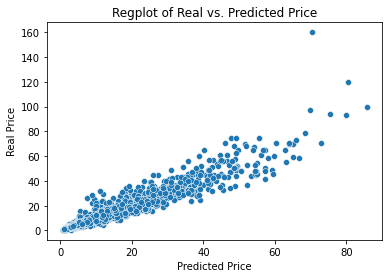

In [176]:
#Making a regplot so we can see how the actual/predicted prices change overall. Not using logs.
sns.scatterplot(x="Predicted Price", y="Real Price", data=result_tuning)
plt.title('Regplot of Real vs. Predicted Price')

Given the model we built, we're seeing predicted prices very close to actual prices in most cases. It seems, however, to be a bit less accurate when it comes to very expensive cars. This is a heteroscedasticity problem. I need to look at the residuals to see how severe this problem is.

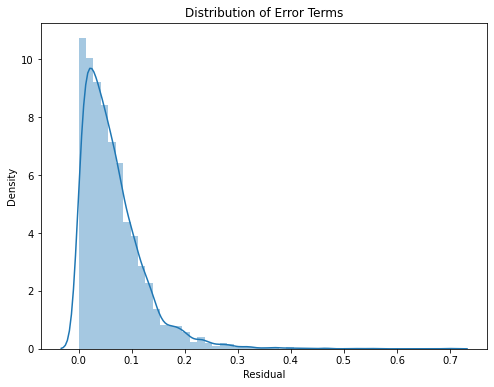

In [177]:
#Making a distribution of error terms.

y_pred = mid_model.predict(x_trainb_final) #predicted values using the final features we chose before.

y_actual=y_trainb.values #List

data_tuples = list(zip(y_actual,y_pred))

result_tuning = pd.DataFrame(data_tuples, columns=['Actual','Predicted'])

result_tuning['Residual']=abs(result_tuning['Actual']-result_tuning['Predicted']);

plt.figure(figsize=(8,6));

plt.title('Distribution of Error Terms')

sns.distplot(result_tuning['Residual']);

In [178]:
#Find the actual skew number
print('The skew of the residual is {}'.format(result_tuning['Residual'].skew()))

The skew of the residual is 2.2583521144248913


Text(0.5, 1.0, 'Residuals across predicted values')

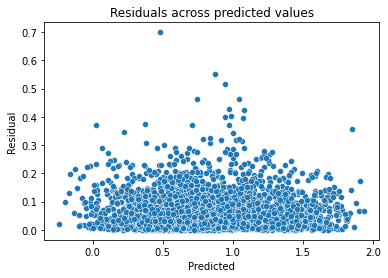

In [179]:
#Scatterplot for residuals/predicted
result_tuning['Residual']=abs(result_tuning['Actual']-result_tuning['Predicted'])
sns.scatterplot(y='Residual',x='Predicted',data=result_tuning)
plt.title('Residuals across predicted values')

Text(0.5, 1.0, 'Residuals across actual values')

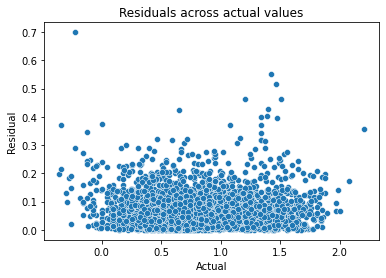

In [180]:
#Scatterplot for residuals/actual
sns.scatterplot(y='Residual',x='Actual',data=result_tuning)
plt.title('Residuals across actual values')

That is not a good distribution of residuals, it should be more normal (ideally between -1 and 1 skew), and the residuals should be much more randomly spread across the actual/predicted values. However, the typical remedy is to do transformations on input variables, and I have already done this.

# Business Recommendations

I can now recommend a range of prices, but I think a cardealer would like to know what sorts of cars tend to sell above the predicted ranges.

In [181]:
#Making a list of all cars with actual prices higher than the upper range of predicted prices
highbux = []
for i,x in predictions.iterrows():
    if predictions.loc[i][0] > predictions.loc[i][3]:
        highbux.append(i)
df_highbux = carz.loc[highbux] #This gets the other details of the car besides prices.
df_highbux.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,Brand,Luxury,Seats_!=5,Seats_cat,Kilometers_Driven_log10,Price_log10,Engine_log10,Power_log10
3655,Hyundai Elantra CRDi SX AT,Ahmedabad,2016,22000,Diesel,Automatic,First,19.50,1582.0,126.24,5.0,16.00,Hyundai,0,Five,Five Seats,4.342423,1.204120,3.199206,2.101197
797,Maruti SX4 S Cross DDiS 200 Zeta,Mumbai,2017,26000,Diesel,Manual,First,23.65,1248.0,88.50,5.0,9.75,Maruti,0,Five,Five Seats,4.414973,0.989005,3.096215,1.946943
1078,Porsche Boxster S tiptronic,Kolkata,2015,10512,Petrol,Automatic,First,8.60,2706.0,265.00,2.0,64.00,Volkswagen,1,Not Five,Seats <5,4.021685,1.806180,3.432328,2.423246
473,Mercedes-Benz E-Class E 220 d,Kochi,2018,26405,Petrol,Automatic,First,12.60,1950.0,191.34,5.0,51.43,Mercedes-Benz,1,Five,Five Seats,4.421686,1.711217,3.290035,2.281806
4578,Toyota Innova 2.5 VX (Diesel) 7 Seater,Hyderabad,2013,107000,Diesel,Manual,Second,12.99,2494.0,100.60,7.0,13.50,Toyota,0,Not Five,Seats >5,5.029384,1.130334,3.396896,2.002598


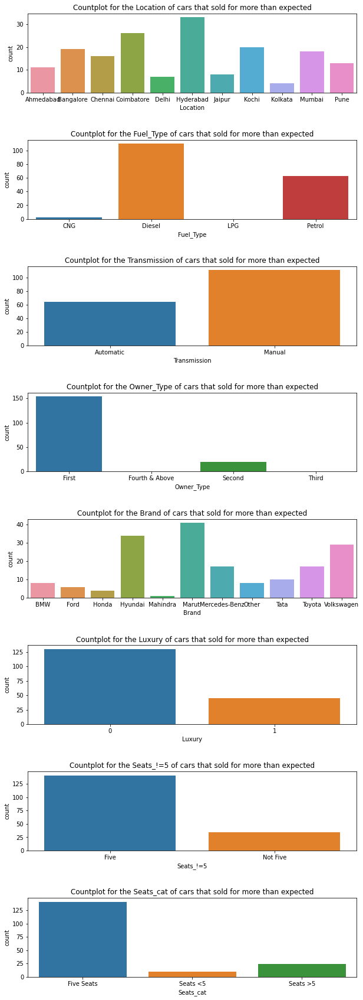

In [182]:
# Making count plots for each categorical variable just to visualize the numbers above.

cat_cols = df_highbux.select_dtypes(include='category').columns.tolist()
plt.figure(figsize=(10,30))
pos = 1
for column in cat_cols:
    plt.subplot(8, 1, pos)
    sns.countplot(df_highbux[column])
    plt.title(f'Countplot for the {column} of cars that sold for more than expected')
    plt.subplots_adjust(hspace = 0.6)
    pos += 1

Unfortunately, there is no obvious pattern for what cars sell well above the predicted price. I expect that a factor outside of the ones collected in this data accounted for those high selling prices.

## Actionable Insights

At Cars4U when we are offered a car, we have to buy it and then turn around and sell it for a profit. 
How can we use these regression models to our benefit?

First, take down the following bits of information for the car:

1. The year the car was made
2. The km per unit of fuel (remove the units)
3. Whether or not the car has 5 seats
4. The log10 of the displacement volume of the engine in CC
5. The log10 of the maximum power of the engine in bhp
6. What city the store is located in, or the closest major city
7. The type of fuel the car uses
8. How many prior owners there are
9. The parent company of the car manufacturer
10. Whether or not the car is a luxury vehicle.
11. The log10 of the number of kilometers driven.

With those values, using our models we can provide a range of prices. We should be able to sell that car within that range about 79% of the time. The chance that we could only sell the car for less than that range is about 12%.

Thus, we can fairly confidently say that we should never buy a car for more than the lower end of the range provided, because we're already risking purchasing it for more than the price it can sell for. In fact, to be very certain we do not overpay, we should not buy a car for more than .063 INR Lakhs lower than the low end of the range. If we follow that rule, we will only pay more than the selling price 2.8% of the time. Of course, even lower is better.

Given that prices can be negotiated in India, a few things should be noted:

If we're looking for a price to put on the sticker, I recommend putting a price at or above the upper range limit on the sticker. Psychologically speaking, starting high and letting the customer haggle the car lower will let the customer feel like they're getting a great deal even if they are not. That, and with the upper limit on the sticker, we will still seem competitive with other local dealers because our prices will be within a reasonable range. If we combine this strategy with never purchasing cars for more than .063 INR Lakhs lower than the low end of the range, I think we'll almost never lose money on a sale.

I would also advise the sales personnel to endeavor to not sell a car for less than the lower end of the provided range. 88% of the time they should be able to sell it for more, and sometimes much more.

If we spot a sales person selling cars routinely above the mid or upper predicted range, consider giving them a raise or asking them to train the other sales personnel.

